In [2]:
from nilearn import plotting, image, connectome
import nibabel as nib
import os
import numpy as np
from pathlib import Path
import tarfile
import seaborn as sns
import matplotlib.pyplot as plt

import os
os.environ["MKL_VERBOSE"] = "0"


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


In [49]:
from nilearn import image, plotting
from atlasreader.atlasreader import read_atlas_peak

"""
available reference atlases
---------------------------
    "aal",
    "aicha",
    "desikan_killiany",
    "destrieux",
    "harvard_oxford",
    "juelich",
    "marsatlas",
    "neuromorphometrics",
    "talairach_ba",
    "talairach_gyrus",
 """

atlas = image.threshold_img("HCP_PTN1200/groupICA/groupICA_3T_HCP1200_MSMAll_d15.ica/melodic_IC_sum.nii.gz", "99.5%") 
atlas_coords = plotting.find_probabilistic_atlas_cut_coords(atlas)
brain_region = []
print("BRAIN REGIONS:\n--------------")
for atlas_coord in atlas_coords:
    region = read_atlas_peak("harvard_oxford", atlas_coord)
    print(region)
    brain_region += [region]

BRAIN REGIONS:
--------------
[[47.0, 'Right_Occipital_Pole'], [23.0, 'Right_Lateral_Occipital_Cortex_superior_division']]
[[90.0, 'Left_Lateral_Occipital_Cortex_superior_division']]
[[73.0, 'Right_Occipital_Pole']]
[[58.0, 'Right_Lateral_Occipital_Cortex_superior_division']]
[[57.0, 'Left_Lateral_Occipital_Cortex_superior_division']]
[[75.0, 'Left_Supramarginal_Gyrus_anterior_division'], [8.0, 'Left_Supramarginal_Gyrus_posterior_division'], [6.0, 'Left_Parietal_Operculum_Cortex']]
[[56.0, 'Right_Angular_Gyrus'], [29.0, 'Right_Lateral_Occipital_Cortex_superior_division']]
[[8.0, 'Right_Occipital_Fusiform_Gyrus']]
[[77.0, 'Right_Lateral_Occipital_Cortex_superior_division']]
[[39.0, 'Left_Supramarginal_Gyrus_posterior_division'], [31.0, 'Left_Angular_Gyrus']]
[[37.0, 'Left_Postcentral_Gyrus'], [28.0, 'Left_Supramarginal_Gyrus_anterior_division'], [8.0, 'Left_Superior_Parietal_Lobule']]
[[26.0, 'Right_Supracalcarine_Cortex'], [23.0, 'Right_Intracalcarine_Cortex'], [13.0, 'Right_Lingual_Gy

In [54]:
brain_region = [
    max(inner_list, key=lambda x: x[0])[-1] if inner_list else None for inner_list in brain_region
]
brain_region

['Right_Occipital_Pole',
 'Left_Lateral_Occipital_Cortex_superior_division',
 'Right_Occipital_Pole',
 'Right_Lateral_Occipital_Cortex_superior_division',
 'Left_Lateral_Occipital_Cortex_superior_division',
 'Left_Supramarginal_Gyrus_anterior_division',
 'Right_Angular_Gyrus',
 'Right_Occipital_Fusiform_Gyrus',
 'Right_Lateral_Occipital_Cortex_superior_division',
 'Left_Supramarginal_Gyrus_posterior_division',
 'Left_Postcentral_Gyrus',
 'Right_Supracalcarine_Cortex',
 'Left_Precentral_Gyrus',
 'Left_Angular_Gyrus',
 'Left_Precuneous_Cortex']

sliding for all

create sliding windows for all

In [37]:
folder = 'HCP_PTN1200/node_timeseries/3T_HCP1200_MSMAll_d15_ts2'
all_files = [f for f in os.listdir(folder) if f.endswith('.txt')]
all_data = []

for filename in all_files:
    file_path = os.path.join(folder, filename)
    subject_data = np.loadtxt(file_path)
    all_data.append(subject_data)

all_data = np.array(all_data)

In [38]:
all_data.shape

(1003, 4800, 15)

get four different windows

In [55]:
data = all_data
average_corr_matrices = []
time_per_group = data.shape[1] // 4

for group_idx in range(4):
    subject_corr_matrices = []
    
    start_time = group_idx * time_per_group
    end_time = start_time + time_per_group
    sub_matrix = data[:, start_time:end_time, :]
    for person_idx in range(data.shape[0]):
        subgroup_data = sub_matrix[person_idx, :, :]
        
        corr_matrix = np.corrcoef(subgroup_data.T)
        
        subject_corr_matrices.append(corr_matrix)
    
    average_corr_matrix = np.mean(subject_corr_matrices, axis=0)
    
    average_corr_matrices.append(average_corr_matrix)
    

average_corr_matrices = np.array(average_corr_matrices)

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


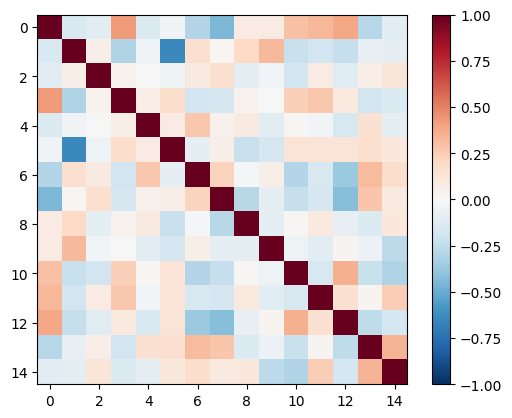

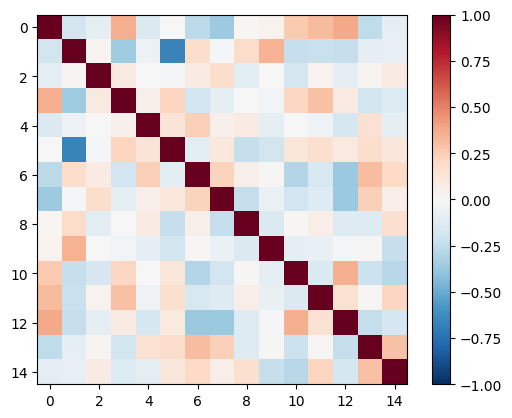

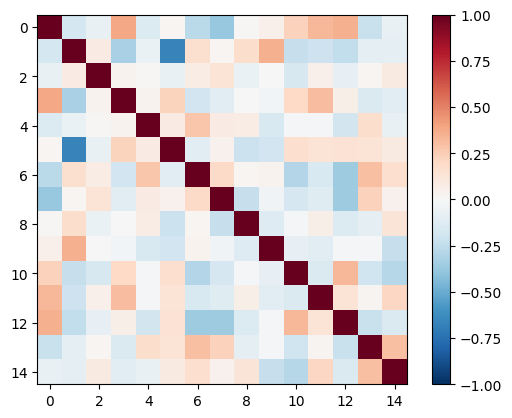

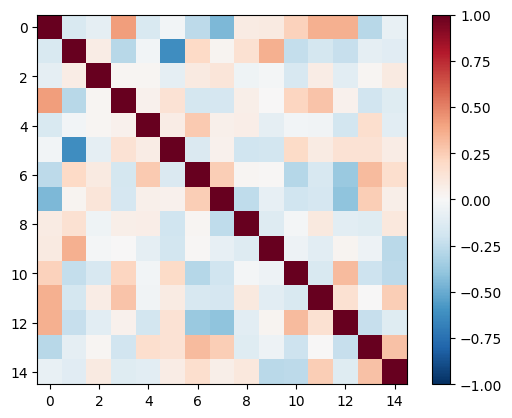

In [57]:
for sub_corr_matrix in average_corr_matrices:
    plt.figure()
    plt.imshow(sub_corr_matrix, cmap="RdBu_r", interpolation="none", vmin = -1, vmax = 1)
    plt.colorbar()
    plt.show()

whole graph for sliding window correlation

it is for the all regions of the brain in one sliding window correlation

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


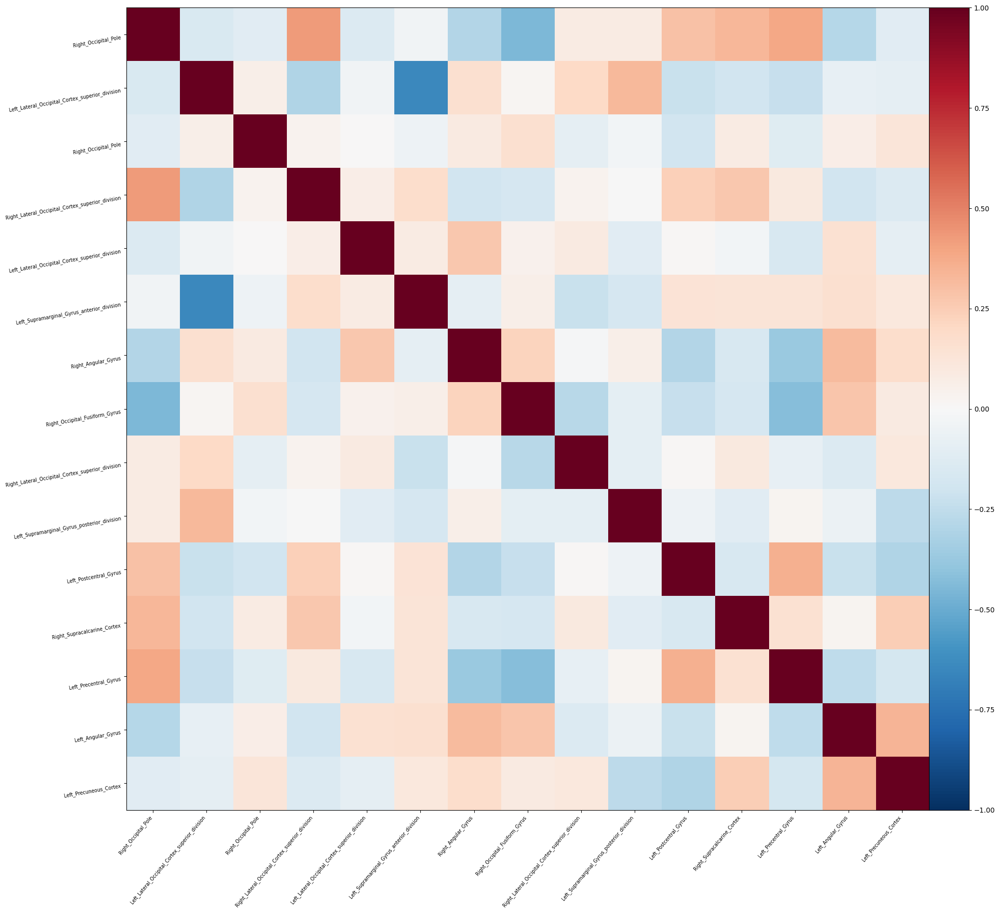

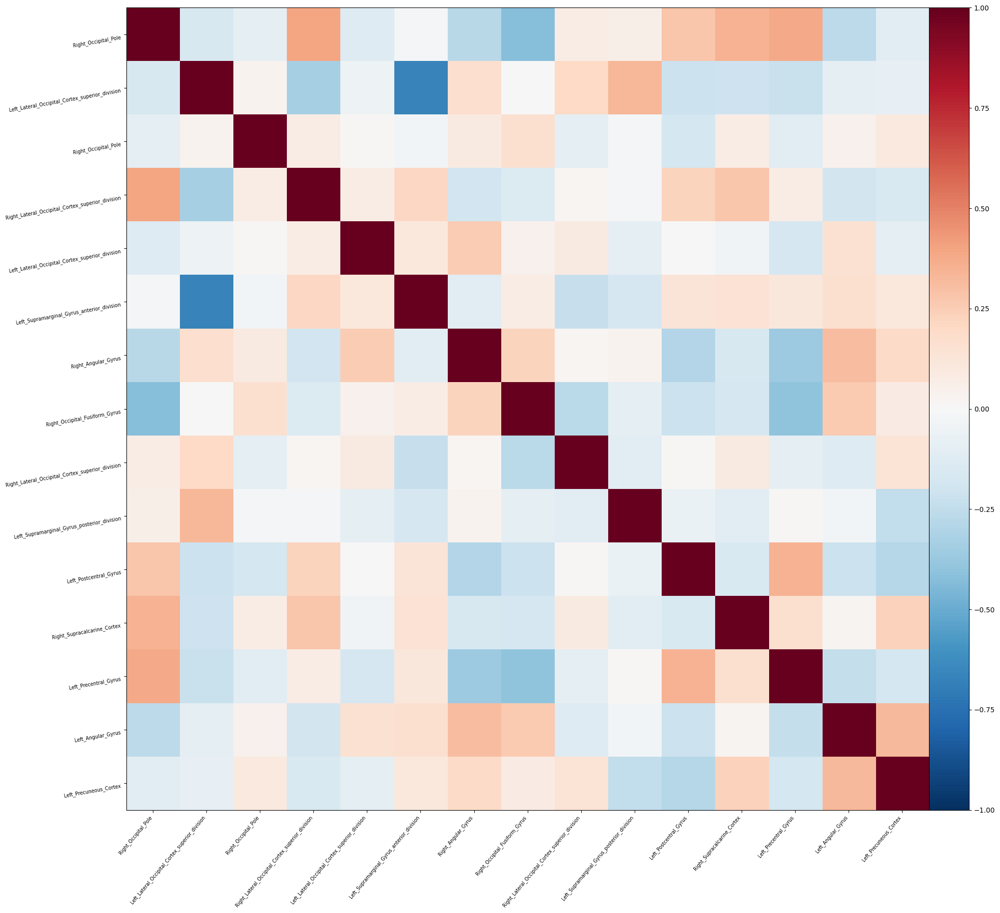

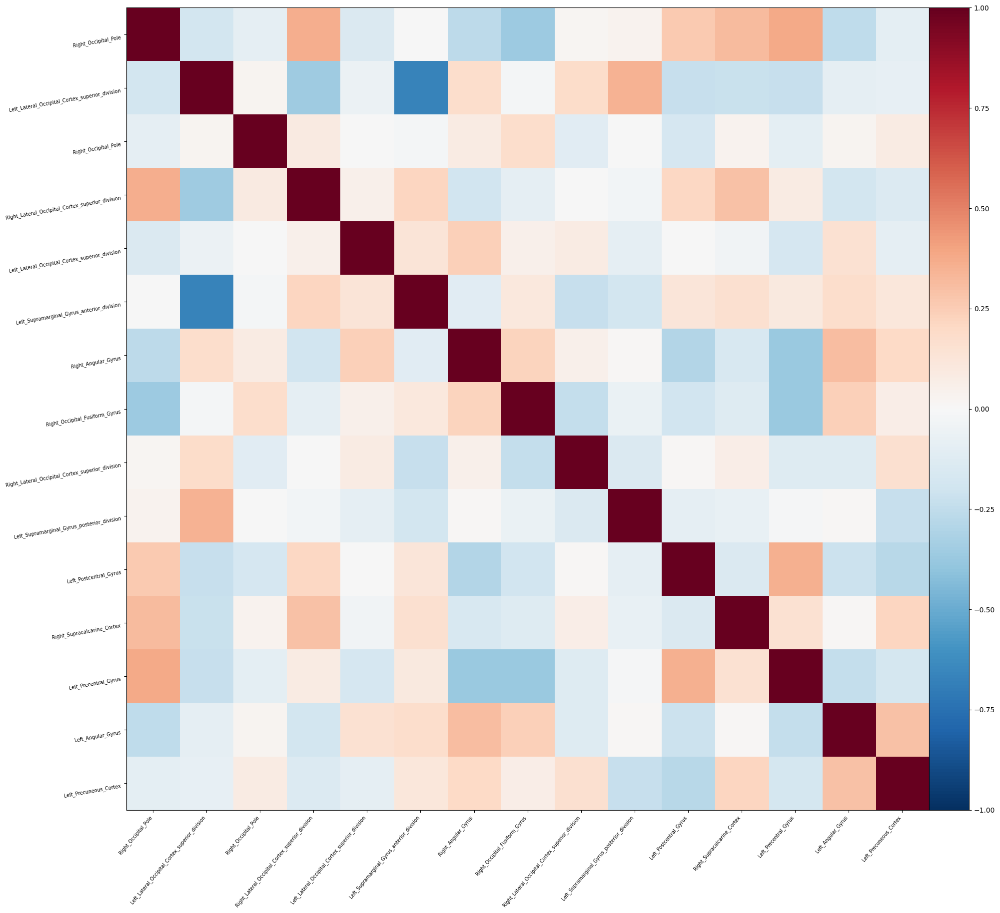

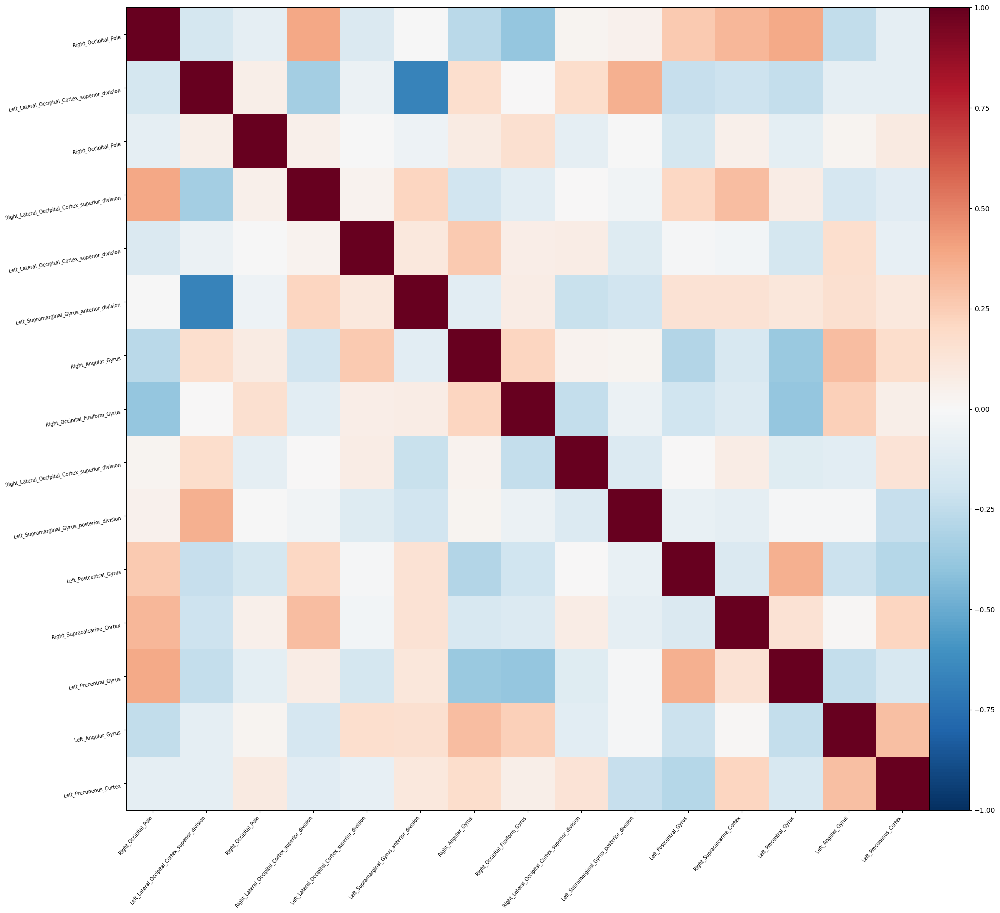

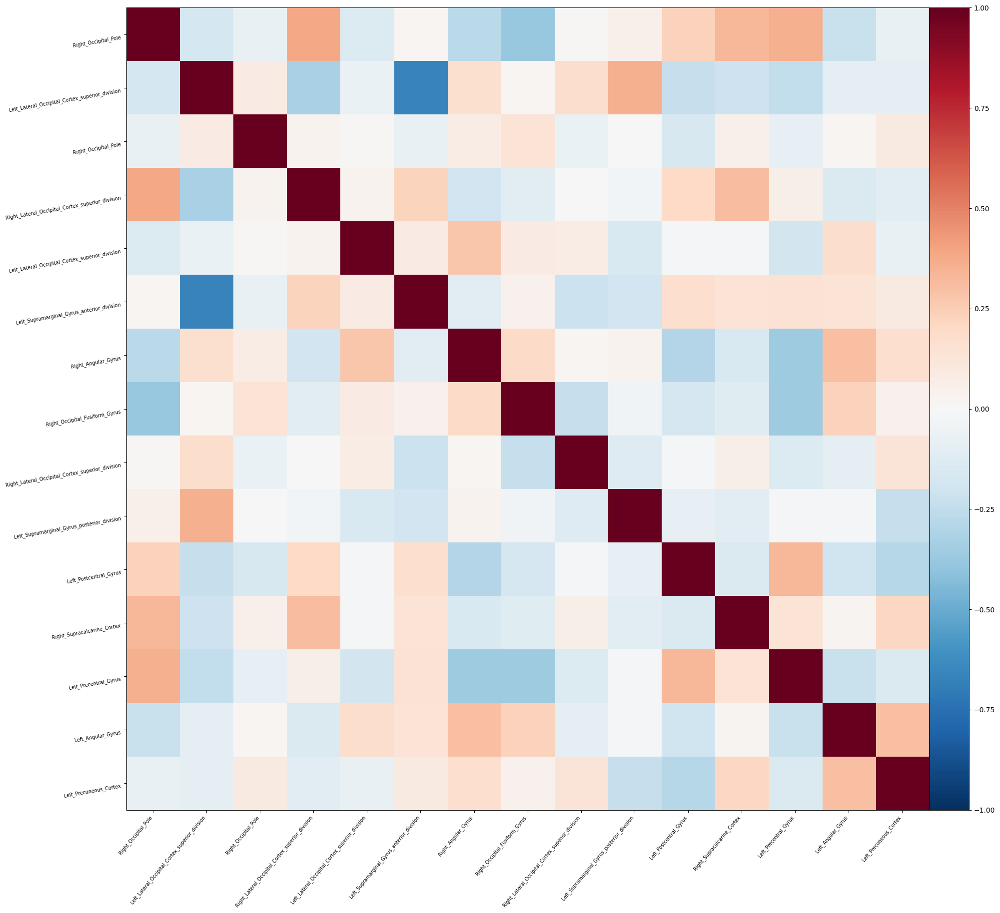

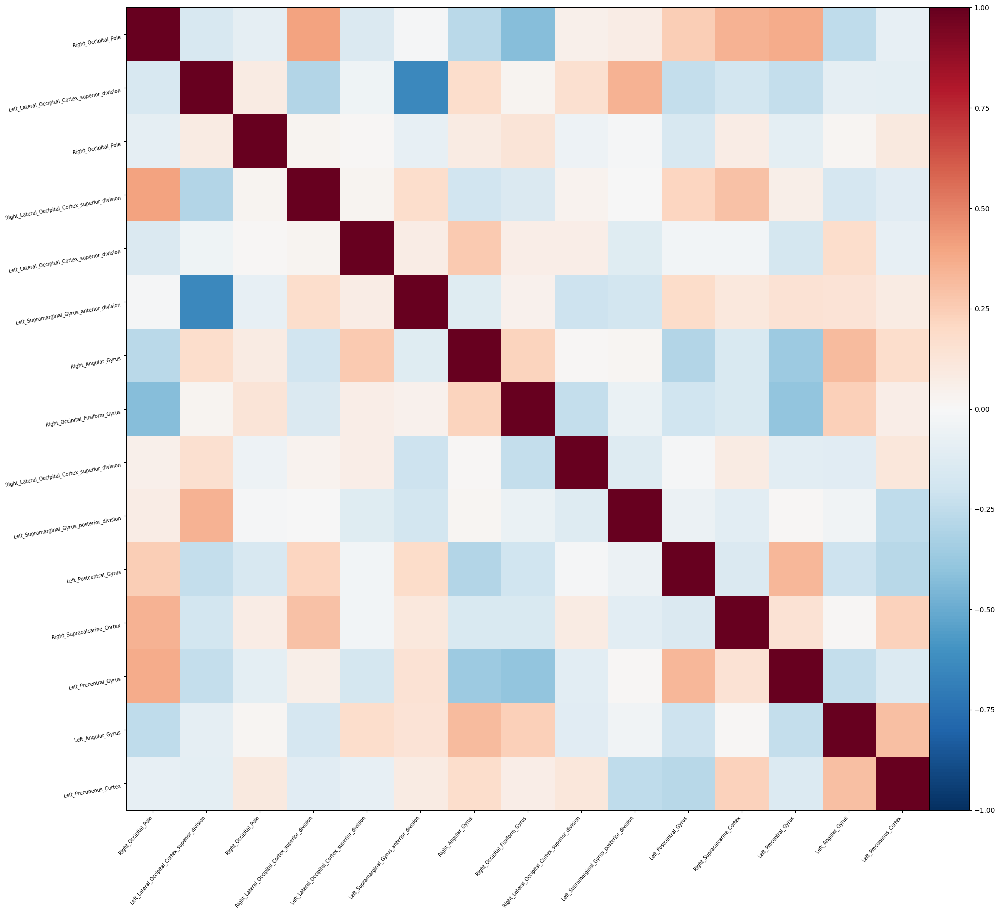

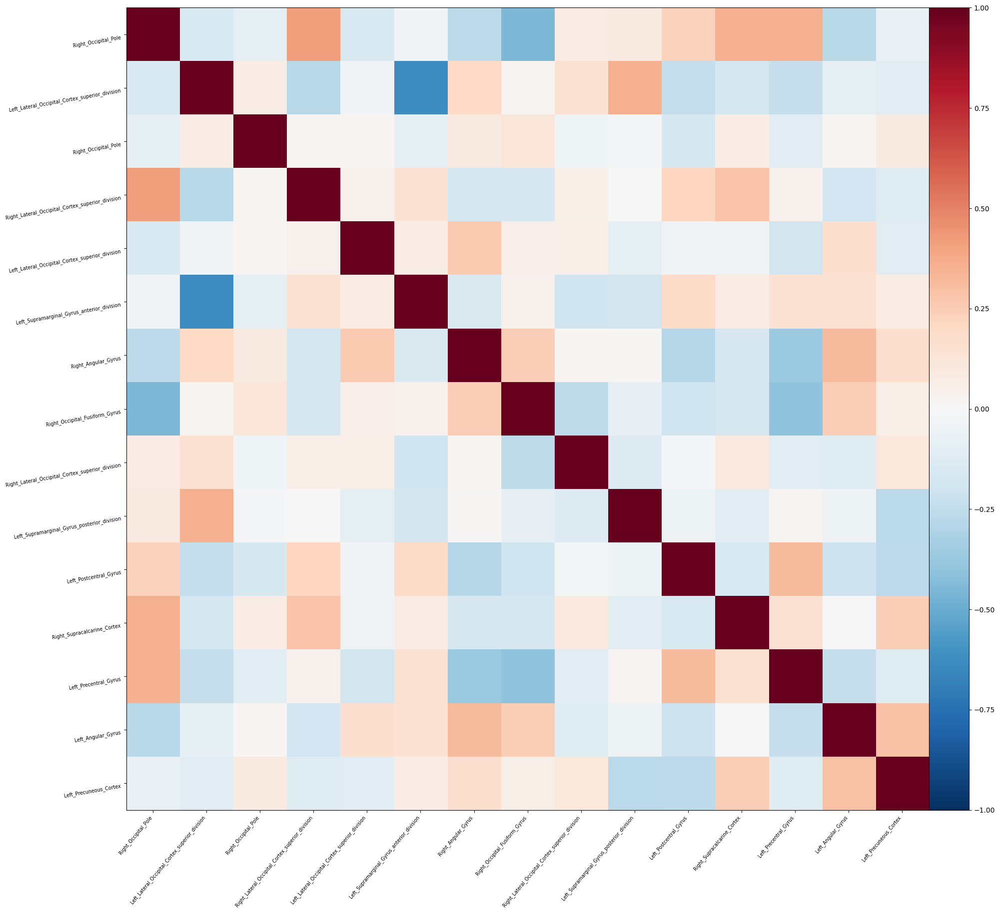

In [58]:
import numpy as np

def sliding_window_corr(data, time_per_group=None, overlap=None):
    if time_per_group is None:
        time_per_group = data.shape[1] // 4 
    if overlap is None:
        overlap = time_per_group // 2 
    
    num_windows = (data.shape[1] - overlap) // overlap
    
    average_corr_matrices_slid = []

    for group_idx in range(num_windows):
        subject_corr_matrices_slid = []
        
        start_time = group_idx * overlap
        end_time = start_time + time_per_group
        
        
        
        sub_matrix = data[:, start_time:end_time, :]
        
        for person_idx in range(data.shape[0]):
            subgroup_data = sub_matrix[person_idx, :, :]
            corr_matrix = np.corrcoef(subgroup_data.T)
            subject_corr_matrices_slid.append(corr_matrix)
        
        average_corr_matrix_slid = np.mean(subject_corr_matrices_slid, axis=0)
        
        average_corr_matrices_slid.append(average_corr_matrix_slid)

    for sub_corr_matrix in average_corr_matrices_slid:
        plotting.plot_matrix(sub_corr_matrix, labels = brain_region, cmap = "RdBu_r", figure = (20, 20), vmin=-1, vmax=1);   

    return np.array(average_corr_matrices_slid)


data = all_data
average_corr_matrices_slid = sliding_window_corr(data)


In [60]:
import plotly.graph_objects as go

brain_region_index = [f"Region {i+1}" for i in range(15)]

fig = go.Figure(
    data=go.Heatmap(
        z=average_corr_matrices_slid[0], 
        x=brain_region_index,
        y=brain_region_index,
        colorscale="RdBu_r",
        zmin=-1,
        zmax=1,
        colorbar=dict(title="Correlation", titleside="right", thickness=20)
    )
)

frames = [
    go.Frame(
        data=go.Heatmap(
            z=matrix,
            x=brain_region_index,
            y=brain_region_index,
            colorscale="RdBu_r",
            zmin=-1,
            zmax=1
        ),
        name=f"Window {i+1}"
    )
    for i, matrix in enumerate(average_corr_matrices_slid)
]

fig.frames = frames

fig.update_layout(
    title="Brain Connectivity Over Time (100 x 100 Matrix)",
    xaxis_title="Brain Region",
    yaxis_title="Brain Region",
    xaxis_nticks=len(brain_region),
    yaxis_nticks=len(brain_region),
    width=1200,
    height=1200,
    font=dict(size=10), 
    updatemenus=[
        {
            "type": "buttons",
            "showactive": False,
            "buttons": [
                {
                    "label": "Play",
                    "method": "animate",
                    "args": [None, {"frame": {"duration": 500, "redraw": True}, "fromcurrent": True}]
                },
                {
                    "label": "Pause",
                    "method": "animate",
                    "args": [[None], {"frame": {"duration": 0, "redraw": True}, "mode": "immediate"}]
                }
            ]
        }
    ],
    sliders=[{
        "active": 0,
        "yanchor": "top",
        "xanchor": "left",
        "currentvalue": {"prefix": "Time Window: ", "font": {"size": 20}},
        "pad": {"b": 10, "t": 50},
        "len": 0.9,
        "x": 0.1,
        "y": 0,
        "steps": [
            {"args": [[f"Window {i+1}"], {"frame": {"duration": 300, "redraw": True}, "mode": "immediate"}],
             "label": f"{i+1}", "method": "animate"}
            for i in range(len(average_corr_matrices_slid))
        ]
    }]
)

fig.show()


close up look for the correlation matrix

this function is for the divided brain region as we wished for close up analysis in each brain area

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


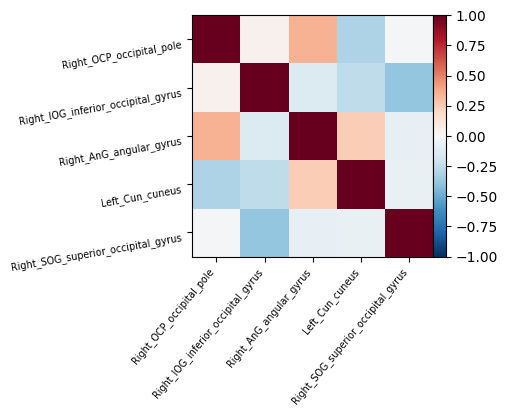

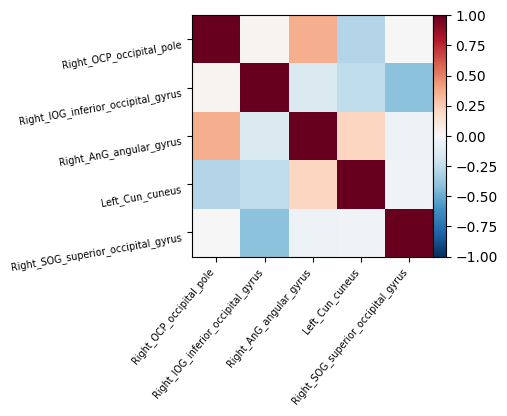

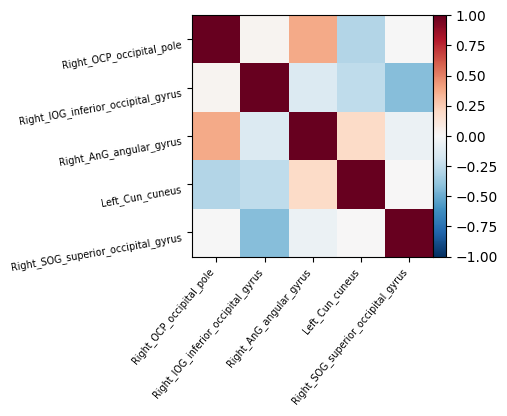

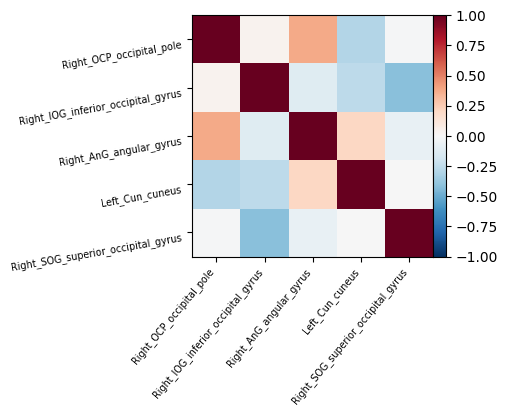

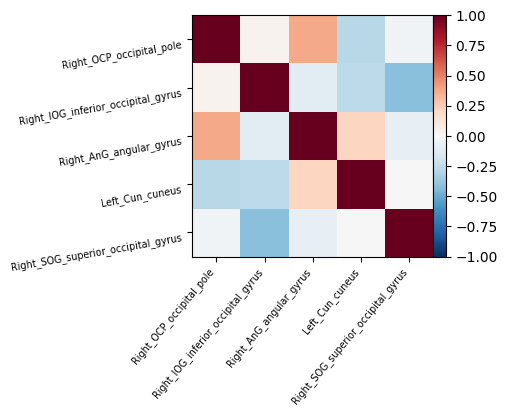

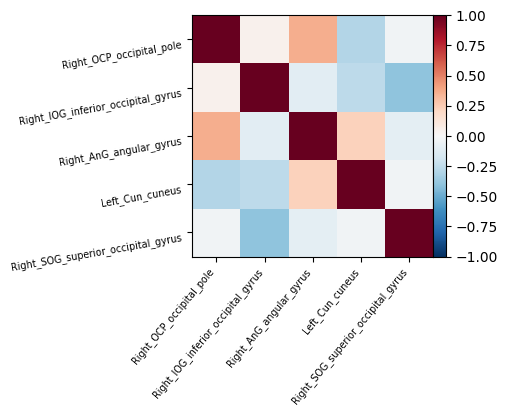

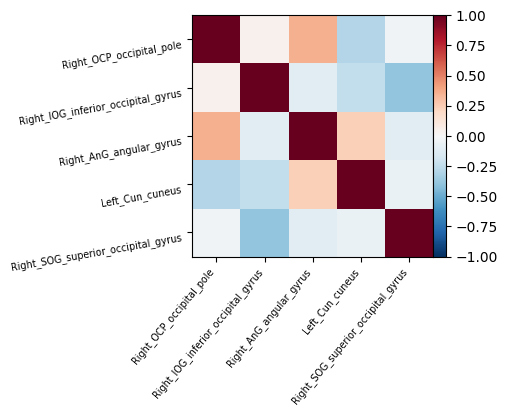

In [13]:
def sliding_window_corr_for_region(data, region=None,time_per_group=None, overlap=None):
    if time_per_group is None:
        time_per_group = data.shape[1] // 4 
    if overlap is None:
        overlap = time_per_group // 2 
    
    
    num_windows = (data.shape[1] - overlap) // overlap
    
    average_corr_matrices_slid = []

    for group_idx in range(num_windows):
        subject_corr_matrices_slid = []
        
        start_time = group_idx * overlap
        end_time = start_time + time_per_group
        
        
        
        sub_matrix = data[:, start_time:end_time, :]
        
        for person_idx in range(data.shape[0]):
            if region is None:
                subgroup_data = sub_matrix[person_idx, :, :]
            else:
                subgroup_data = sub_matrix[person_idx, :, region[0]:region[-1]]
            corr_matrix = np.corrcoef(subgroup_data.T)
            subject_corr_matrices_slid.append(corr_matrix)
        
        average_corr_matrix_slid = np.mean(subject_corr_matrices_slid, axis=0)
        
        average_corr_matrices_slid.append(average_corr_matrix_slid)

    if region is not None:
        ranged_brain_region = brain_region[region[0]:region[-1]]
    else:
        ranged_brain_region = brain_region
    
    for sub_corr_matrix in average_corr_matrices_slid:
        plotting.plot_matrix(sub_corr_matrix, labels = ranged_brain_region, cmap = "RdBu_r", figure = (3, 3), vmin=-1, vmax=1);   

    return average_corr_matrices_slid, ranged_brain_region

   
    

data = all_data
average_corr_matrices_slid_all = sliding_window_corr_for_region(data, region=[0, 5])
average_corr_matrices_slid = average_corr_matrices_slid_all[0]
ranged_brain_region = average_corr_matrices_slid_all[1]

In [14]:
import plotly.graph_objects as go

brain_region_index = [f"Region {i+1}" for i in range(len(average_corr_matrices_slid[0]))]

fig = go.Figure(
    data=go.Heatmap(
        z=average_corr_matrices_slid[0], 
        x=brain_region_index,
        y=brain_region_index,
        colorscale="RdBu_r",
        zmin=-1,
        zmax=1,
        colorbar=dict(title="Correlation", titleside="right", thickness=20)
    )
)

frames = [
    go.Frame(
        data=go.Heatmap(
            z=matrix,
            x=brain_region_index,
            y=brain_region_index,
            colorscale="RdBu_r",
            zmin=-1,
            zmax=1
        ),
        name=f"Window {i+1}"
    )
    for i, matrix in enumerate(average_corr_matrices_slid)
]

fig.frames = frames

fig.update_layout(
    title=f"Brain Connectivity Over Time ({len(average_corr_matrices_slid[0])} x {len(average_corr_matrices_slid[0])} Matrix)",
    xaxis_title="Brain Region",
    yaxis_title="Brain Region",
    xaxis_nticks=len(brain_region),
    yaxis_nticks=len(brain_region),
    width=700,
    height=700,
    font=dict(size=10), 
    updatemenus=[
        {
            "type": "buttons",
            "showactive": False,
            "buttons": [
                {
                    "label": "Play",
                    "method": "animate",
                    "args": [None, {"frame": {"duration": 500, "redraw": True}, "fromcurrent": True}]
                },
                {
                    "label": "Pause",
                    "method": "animate",
                    "args": [[None], {"frame": {"duration": 0, "redraw": True}, "mode": "immediate"}]
                }
            ]
        }
    ],
    sliders=[{
        "active": 0,
        "yanchor": "top",
        "xanchor": "left",
        "currentvalue": {"prefix": "Time Window: ", "font": {"size": 20}},
        "pad": {"b": 10, "t": 50},
        "len": 0.9,
        "x": 0.1,
        "y": 0,
        "steps": [
            {"args": [[f"Window {i+1}"], {"frame": {"duration": 300, "redraw": True}, "mode": "immediate"}],
             "label": f"{i+1}", "method": "animate"}
            for i in range(len(average_corr_matrices_slid))
        ]
    }]
)

fig.show()
print(ranged_brain_region)

['Right_OCP_occipital_pole', 'Right_IOG_inferior_occipital_gyrus', 'Right_AnG_angular_gyrus', 'Left_Cun_cuneus', 'Right_SOG_superior_occipital_gyrus']


Show the brain with the connections

In [65]:
from nilearn import image, plotting
import matplotlib.pyplot as plt
import numpy as np

atlas = image.load_img("HCP_PTN1200/groupICA/groupICA_3T_HCP1200_MSMAll_d15.ica/melodic_IC_sum.nii.gz")
atlas = image.threshold_img(atlas, "99.5%") 
print("atlas has shape", ["x", "y", "z", "region"], "=", atlas.shape)

fig, axs = plt.subplots(nrows=3, figsize=(10, 12))

# plot atlas, all regions
plotting.plot_prob_atlas(atlas, colorbar=True, draw_cross=False, axes=axs[0])

# plot atlas, center coordinates
# get the x,y,z coordinates for each of the regions
atlas_coords = plotting.find_probabilistic_atlas_cut_coords(atlas)
plotting.plot_markers(node_values=np.arange(15), node_coords=atlas_coords, axes=axs[1])

# plot atlas, one region
idx = 0 # first region
atlas_region = image.index_img(atlas, idx)
plotting.plot_stat_map(
    atlas_region, draw_cross=False, axes=axs[2]
)

atlas has shape ['x', 'y', 'z', 'region'] = (91, 109, 91, 15)


/Users/zhuoxuanju/opt/anaconda3/envs/dsc80/lib/python3.8/site-packages/numpy/ma/core.py:2826: UserWarning:


/Users/zhuoxuanju/opt/anaconda3/envs/dsc80/lib/python3.8/site-packages/matplotlib/contour.py:1454: UserWarning:


/Users/zhuoxuanju/opt/anaconda3/envs/dsc80/lib/python3.8/site-packages/matplotlib/contour.py:1455: UserWarning:


/Users/zhuoxuanju/opt/anaconda3/envs/dsc80/lib/python3.8/site-packages/nilearn/plotting/displays/_axes.py:74: UserWarning:

linewidths is ignored by contourf



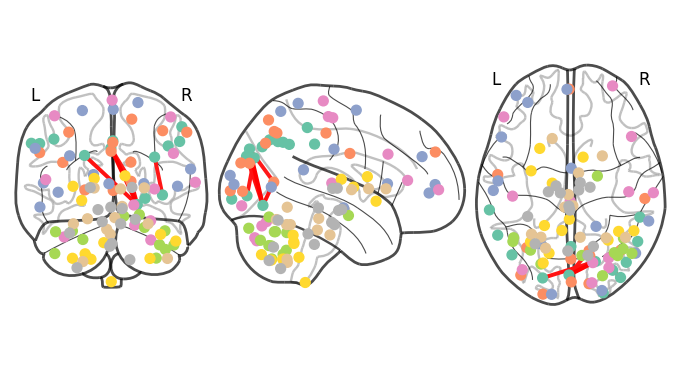

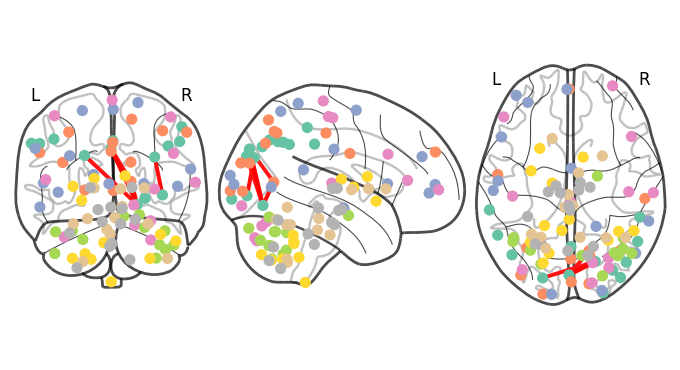

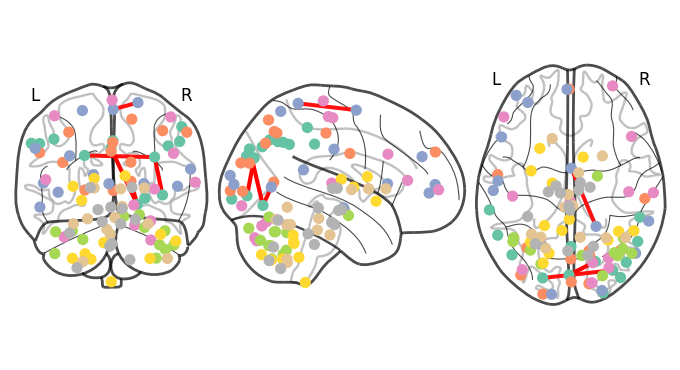

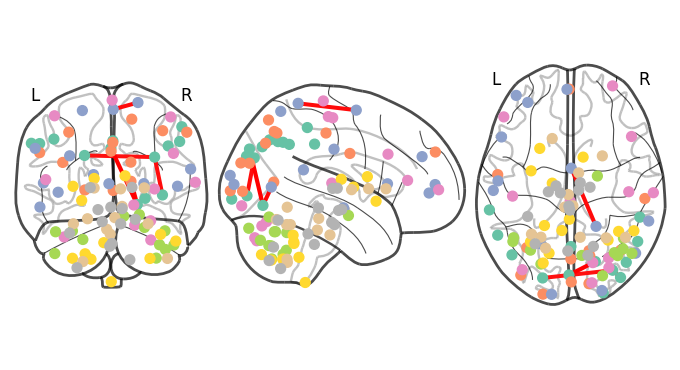

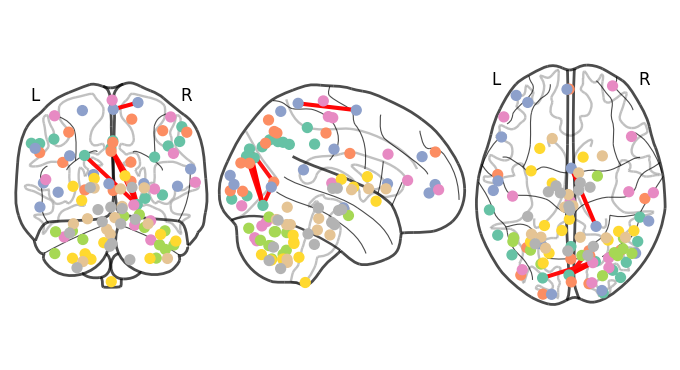

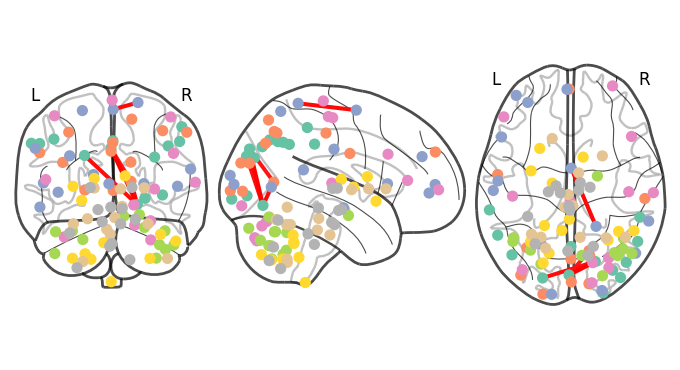

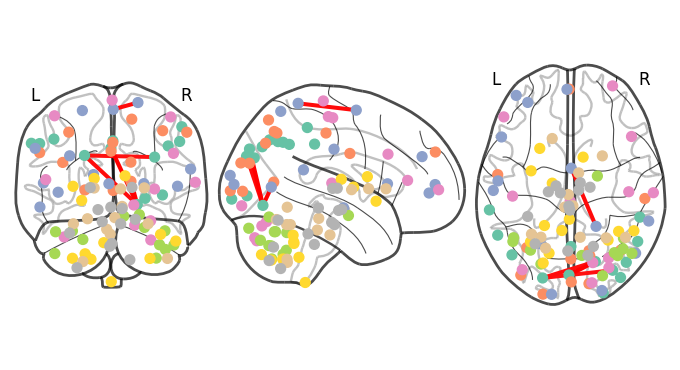

In [ ]:
for each_window in average_corr_matrices_slid:
    plotting.plot_connectome(each_window, atlas_coords, edge_threshold="99.9%")

In [ ]:
import plotly.graph_objects as go

threshold = 0.5

fig = go.Figure()


for t in range(average_corr_matrices_slid.shape[0]):
    connectivity_matrix = average_corr_matrices_slid[t]
    
    edges = np.where(connectivity_matrix > threshold)
    
    x_edges, y_edges, z_edges = [], [], []
    for start, end in zip(edges[0], edges[1]):
        if start != end: 
            x_edges += [atlas_coords[start, 0], atlas_coords[end, 0], None]
            y_edges += [atlas_coords[start, 1], atlas_coords[end, 1], None]
            z_edges += [atlas_coords[start, 2], atlas_coords[end, 2], None]
    
    edge_trace = go.Scatter3d(
        x=x_edges, y=y_edges, z=z_edges,
        mode='lines',
        line=dict(width=1, color='red'),
        hoverinfo='none'
    )
    
    node_trace = go.Scatter3d(
        x=atlas_coords[:, 0],
        y=atlas_coords[:, 1],
        z=atlas_coords[:, 2],
        mode='markers',
        marker=dict(size=5, color='blue'),
        hoverinfo='text',
        text=[f"Node {i}" for i in range(atlas_coords.shape[0])]
    )
    
    fig.add_trace(edge_trace)
    fig.add_trace(node_trace)
    # fig.frames.append(go.Frame(data=[edge_trace, node_trace], name=str(t)))

fig.update_layout(
    scene=dict(
        xaxis=dict(title='X'),
        yaxis=dict(title='Y'),
        zaxis=dict(title='Z'),
    ),
    title="Interactive Brain Connectivity Over Time",
    updatemenus=[{
        "buttons": [
            {
                "args": [None, {"frame": {"duration": 500, "redraw": True}, "fromcurrent": True}],
                "label": "Play",
                "method": "animate"
            },
            {
                "args": [[None], {"frame": {"duration": 0, "redraw": True}, "mode": "immediate", "transition": {"duration": 0}}],
                "label": "Pause",
                "method": "animate"
            }
        ],
        "direction": "left",
        "pad": {"r": 10, "t": 87},
        "showactive": False,
        "type": "buttons",
        "x": 0.1,
        "xanchor": "right",
        "y": 0,
        "yanchor": "top"
    }],
    sliders=[{
        "active": 0,
        "yanchor": "top",
        "xanchor": "left",
        "currentvalue": {
            "font": {"size": 20},
            "prefix": "Time Step: ",
            "visible": True,
            "xanchor": "right"
        },
        "transition": {"duration": 300, "easing": "cubic-in-out"},
        "pad": {"b": 10, "t": 50},
        "len": 0.9,
        "x": 0.1,
        "y": 0,
        "steps": [
            {"args": [[str(k)], {"frame": {"duration": 300, "redraw": True}, "mode": "immediate", "transition": {"duration": 300}}],
             "label": str(k), "method": "animate"}
            for k in range(average_corr_matrices_slid.shape[0])
        ]
    }]
)

fig.show()


In [ ]:
plotting.view_connectome(average_corr_matrices_slid[0], atlas_coords)

find the map with one region vs all other regions

100206

explore with the 5 mins as a window

In [6]:
path_file = 'HCP_PTN1200/node_timeseries/3T_HCP1200_MSMAll_d100_ts2/100206.txt'
data = np.loadtxt(path_file, dtype=float)
data.shape


(4800, 100)

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


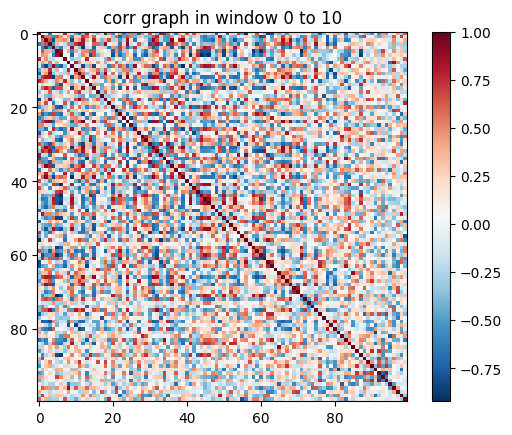

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


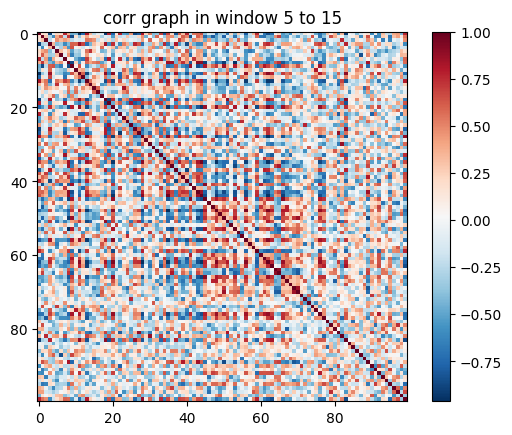

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


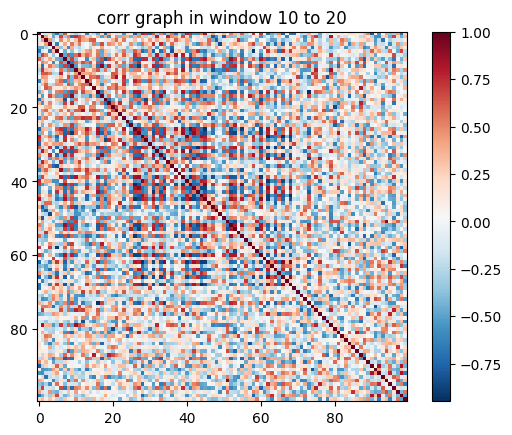

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


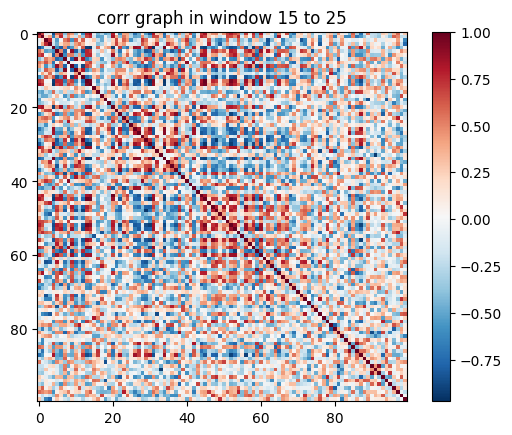

In [74]:
count = 0
for i in range(data.shape[0]):
    if count % 5 != 0:
        count += 1
        continue
    count += 1
    
    sub_data = data[i: i + 10]
    sub_corr_matrix = np.corrcoef(sub_data.T)
    plt.imshow(sub_corr_matrix, cmap="RdBu_r", interpolation="none")
    plt.colorbar()
    plt.title(f"corr graph in window {i} to {i+10}")
    plt.show()

    if i + 5 == 20:
        break

In [41]:
test_data = data[0:10]
result = connectome.ConnectivityMeasure(test_data, kind = "tangent")

In [45]:
result.cov_estimator

(10, 100)

brain view

In [29]:
atlas_region

atlas has shape ['x', 'y', 'z', 'region'] = (91, 109, 91, 100)


/Users/zhuoxuanju/opt/anaconda3/envs/dsc80/lib/python3.8/site-packages/nilearn/plotting/displays/_axes.py:74: UserWarning: No contour levels were found within the data range.
  im = getattr(ax, type)(


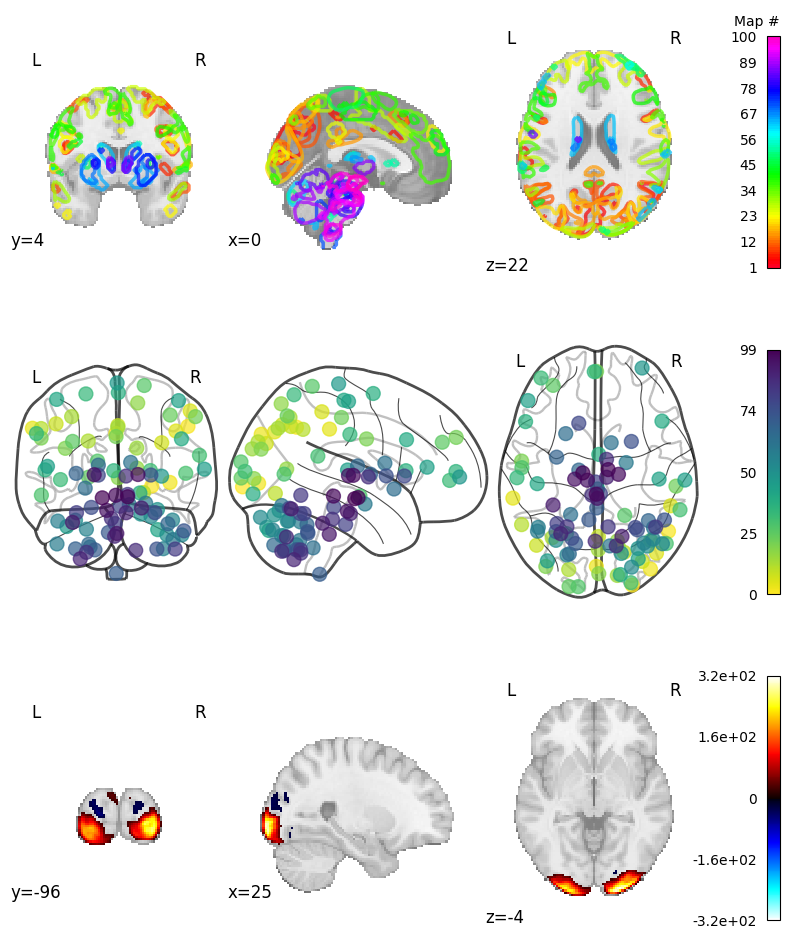

In [40]:
from nilearn import image, plotting
import matplotlib.pyplot as plt
import numpy as np

atlas = image.load_img("HCP_PTN1200/groupICA/groupICA_3T_HCP1200_MSMAll_d100.ica/melodic_IC_sum.nii.gz")
atlas = image.threshold_img(atlas, "99.5%") 
print("atlas has shape", ["x", "y", "z", "region"], "=", atlas.shape)

fig, axs = plt.subplots(nrows=3, figsize=(10, 12))

# plot atlas, all regions
plotting.plot_prob_atlas(atlas, colorbar=True, draw_cross=False, axes=axs[0])

# plot atlas, center coordinates
# get the x,y,z coordinates for each of the regions
atlas_coords = plotting.find_probabilistic_atlas_cut_coords(atlas)
plotting.plot_markers(node_values=np.arange(100), node_coords=atlas_coords, axes=axs[1])

# plot atlas, one region
idx = 0 # first region
atlas_region = image.index_img(atlas, idx)
plotting.plot_stat_map(
    atlas_region, draw_cross=False, axes=axs[2]
)

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


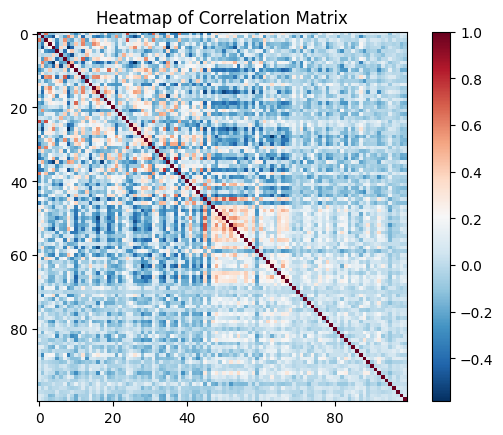

In [73]:
path_file = 'HCP_PTN1200/node_timeseries/3T_HCP1200_MSMAll_d100_ts2/100206.txt'

data = np.loadtxt(path_file, dtype=float)
corr_matrix = np.corrcoef(data.T)
plt.imshow(corr_matrix, cmap='RdBu_r', interpolation='none')
plt.colorbar()
plt.title('Heatmap of Correlation Matrix')
plt.show()

100307

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


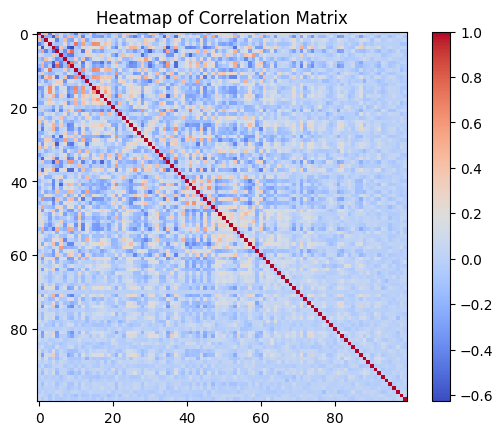

In [5]:
path_file = 'HCP_PTN1200/node_timeseries/3T_HCP1200_MSMAll_d100_ts2/100307.txt'

data = np.loadtxt(path_file, dtype=float)
corr_matrix = np.corrcoef(data.T)
plt.imshow(corr_matrix, cmap='coolwarm', interpolation='none')
plt.colorbar()
plt.title('Heatmap of Correlation Matrix')
plt.show()

100408

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


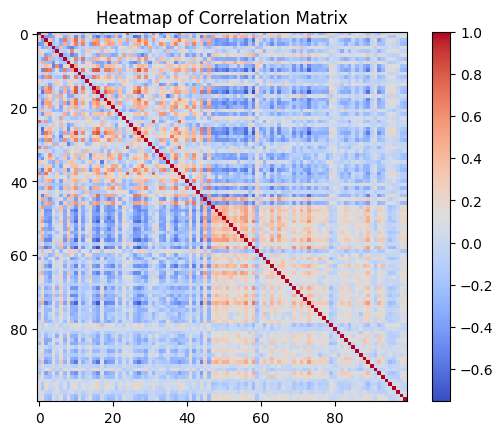

In [6]:
path_file = 'HCP_PTN1200/node_timeseries/3T_HCP1200_MSMAll_d100_ts2/100408.txt'

data = np.loadtxt(path_file, dtype=float)
corr_matrix = np.corrcoef(data.T)
plt.imshow(corr_matrix, cmap='coolwarm', interpolation='none')
plt.colorbar()
plt.title('Heatmap of Correlation Matrix')
plt.show()

make differently

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


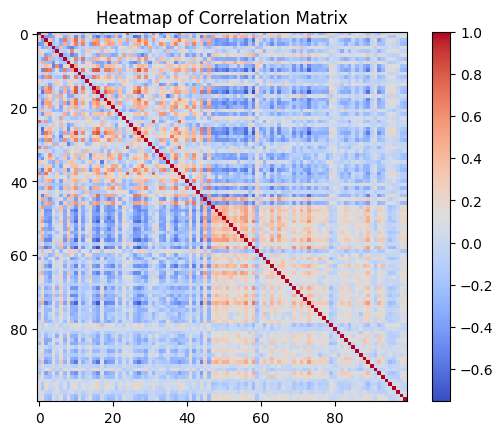

In [7]:
corr = np.corrcoef(data.T)
plt.imshow(corr, cmap='coolwarm', interpolation='none')
plt.colorbar()
plt.title('Heatmap of Correlation Matrix')
plt.show()

In [8]:
#significant points:
np.argwhere((corr >= 0.6) & (corr < 1))

array([[ 0, 24],
       [ 0, 31],
       [ 0, 38],
       [ 2,  2],
       [ 2,  7],
       [ 2, 10],
       [ 2, 27],
       [ 2, 38],
       [ 3, 10],
       [ 3, 12],
       [ 3, 15],
       [ 3, 29],
       [ 3, 33],
       [ 3, 37],
       [ 3, 42],
       [ 5,  9],
       [ 7,  2],
       [ 7, 10],
       [ 7, 12],
       [ 9,  5],
       [10,  2],
       [10,  3],
       [10,  7],
       [10, 12],
       [10, 15],
       [10, 16],
       [10, 18],
       [10, 19],
       [10, 27],
       [10, 29],
       [11, 11],
       [12,  3],
       [12,  7],
       [12, 10],
       [12, 15],
       [12, 29],
       [15,  3],
       [15, 10],
       [15, 12],
       [15, 16],
       [15, 27],
       [16, 10],
       [16, 15],
       [16, 18],
       [16, 26],
       [16, 27],
       [16, 44],
       [18, 10],
       [18, 16],
       [18, 27],
       [18, 38],
       [19, 10],
       [19, 29],
       [20, 37],
       [24,  0],
       [24, 24],
       [24, 31],
       [24, 38],
       [25, 25

In [9]:
upper_tri_indices = np.triu_indices_from(corr, k=1)

filtered_indices = [(i, j) for i, j in zip(upper_tri_indices[0], upper_tri_indices[1]) if corr[i, j] >= 0.5]
filtered_indices

[(0, 24),
 (0, 31),
 (0, 38),
 (1, 47),
 (1, 51),
 (1, 53),
 (1, 58),
 (2, 7),
 (2, 10),
 (2, 12),
 (2, 16),
 (2, 19),
 (2, 24),
 (2, 27),
 (2, 29),
 (2, 31),
 (2, 38),
 (3, 10),
 (3, 12),
 (3, 15),
 (3, 16),
 (3, 19),
 (3, 29),
 (3, 33),
 (3, 37),
 (3, 42),
 (3, 46),
 (5, 9),
 (6, 23),
 (7, 10),
 (7, 12),
 (7, 19),
 (7, 27),
 (7, 29),
 (10, 12),
 (10, 15),
 (10, 16),
 (10, 18),
 (10, 19),
 (10, 27),
 (10, 29),
 (10, 37),
 (10, 38),
 (10, 42),
 (10, 44),
 (10, 46),
 (12, 15),
 (12, 16),
 (12, 27),
 (12, 29),
 (15, 16),
 (15, 18),
 (15, 27),
 (16, 18),
 (16, 19),
 (16, 20),
 (16, 26),
 (16, 27),
 (16, 37),
 (16, 38),
 (16, 44),
 (16, 46),
 (18, 27),
 (18, 38),
 (18, 44),
 (19, 22),
 (19, 27),
 (19, 29),
 (19, 33),
 (19, 37),
 (20, 37),
 (20, 40),
 (20, 42),
 (20, 44),
 (20, 46),
 (21, 28),
 (22, 33),
 (22, 34),
 (24, 31),
 (24, 38),
 (26, 27),
 (26, 37),
 (26, 44),
 (26, 46),
 (27, 29),
 (27, 38),
 (27, 44),
 (27, 46),
 (28, 36),
 (29, 33),
 (29, 37),
 (29, 42),
 (29, 46),
 (31, 38),
 (

relation of 0 and 24


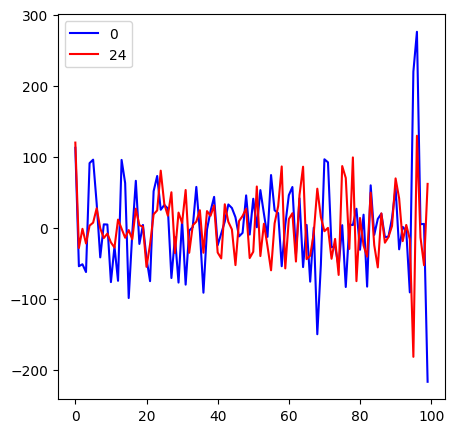

relation of 0 and 31


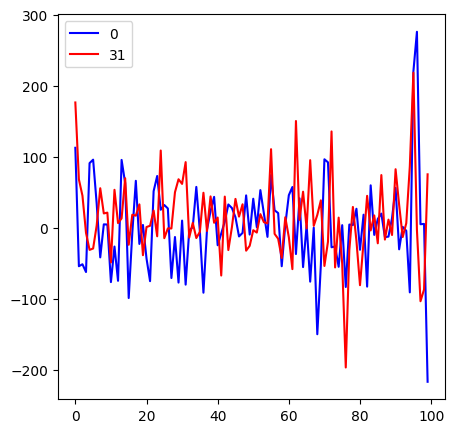

relation of 0 and 38


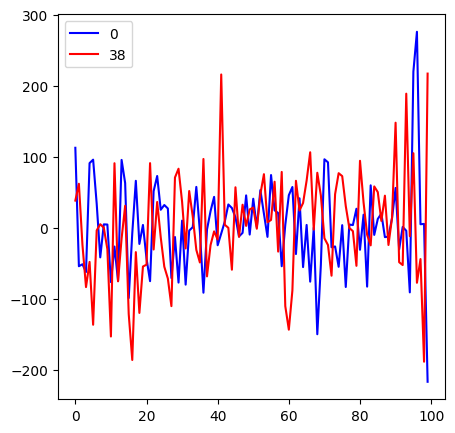

relation of 1 and 47


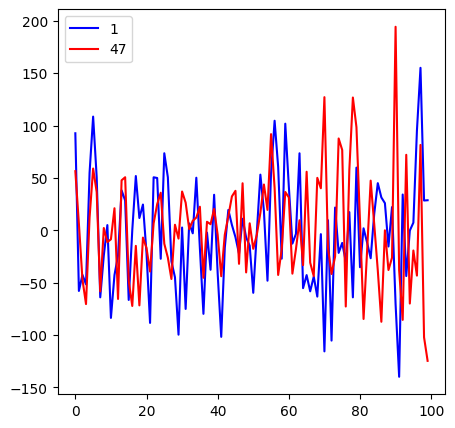

relation of 1 and 51


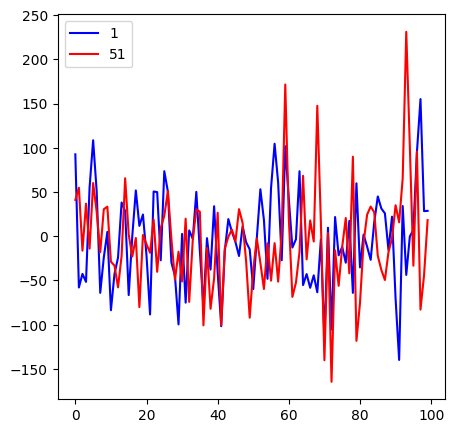

relation of 1 and 53


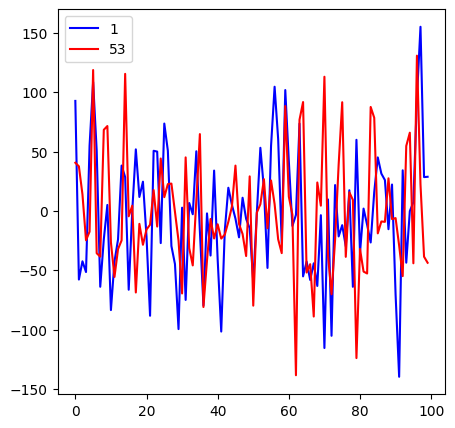

relation of 1 and 58


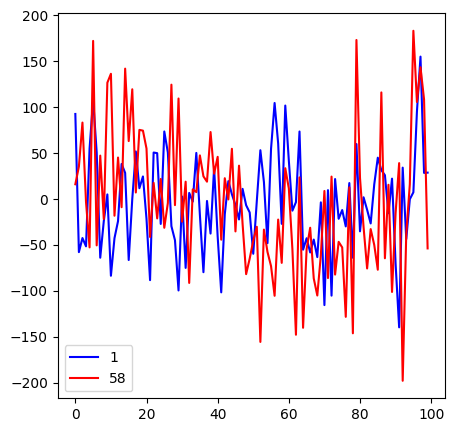

relation of 2 and 7


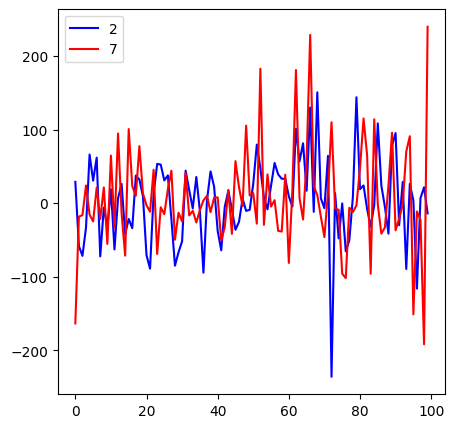

relation of 2 and 10


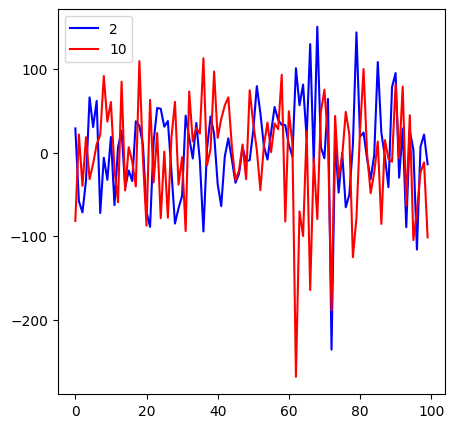

relation of 2 and 12


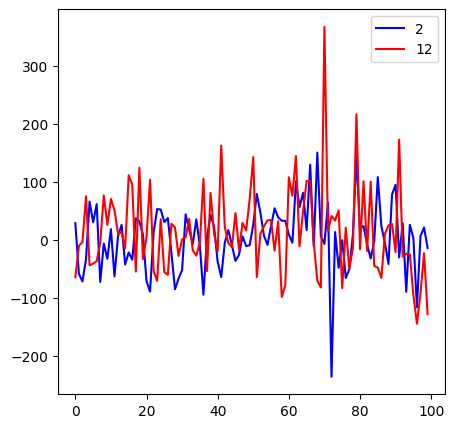

relation of 2 and 16


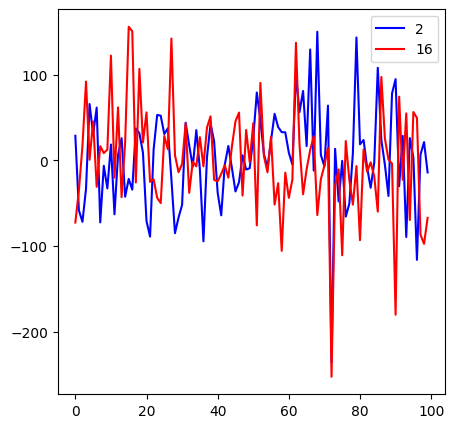

relation of 2 and 19


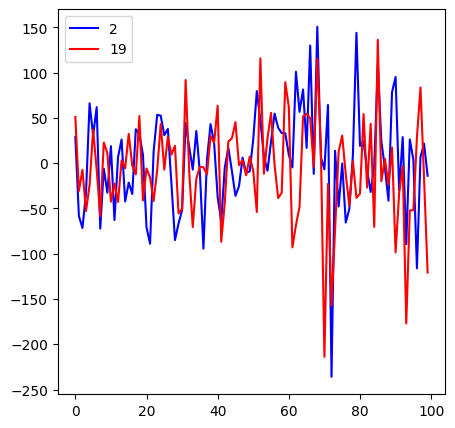

relation of 2 and 24


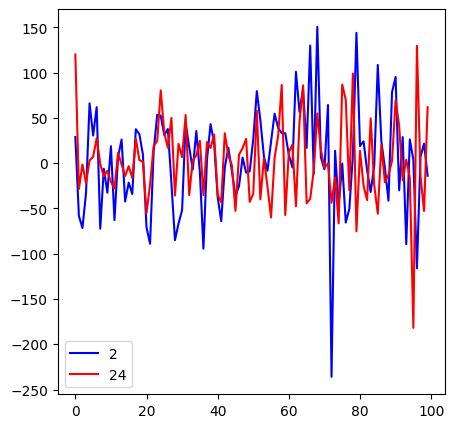

relation of 2 and 27


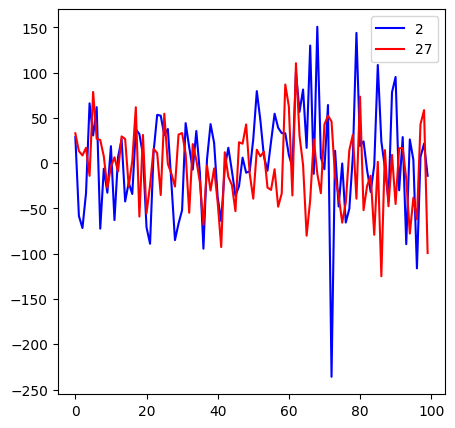

relation of 2 and 29


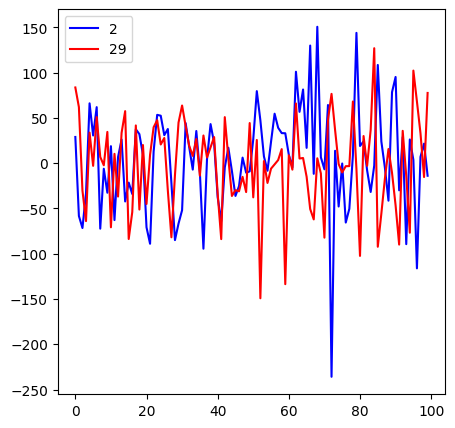

relation of 2 and 31


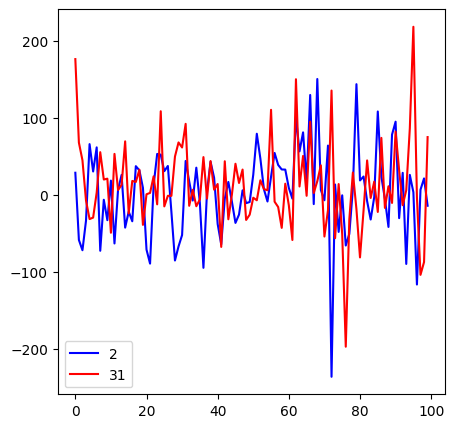

relation of 2 and 38


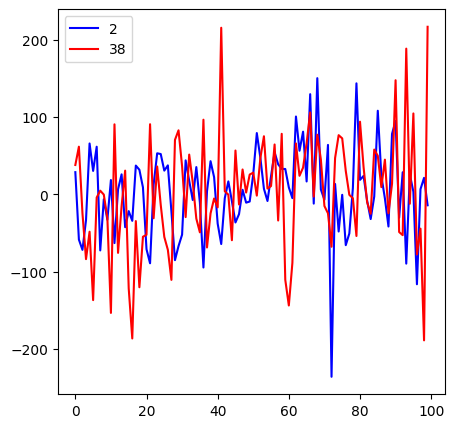

relation of 3 and 10


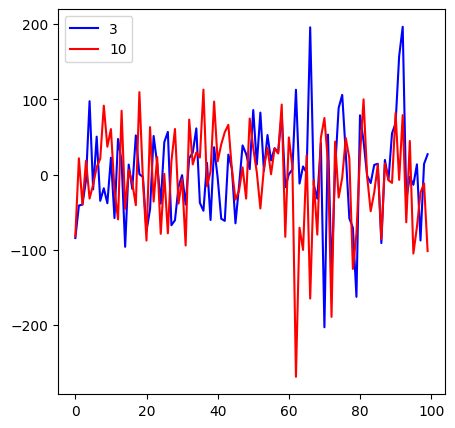

relation of 3 and 12


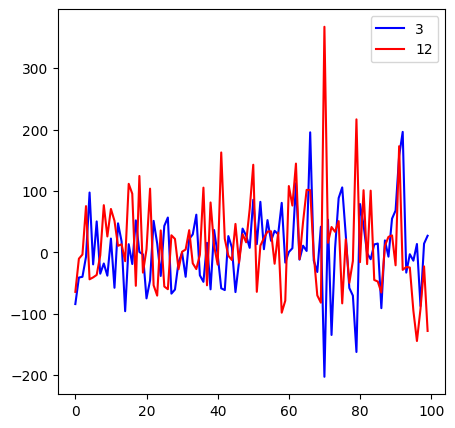

relation of 3 and 15


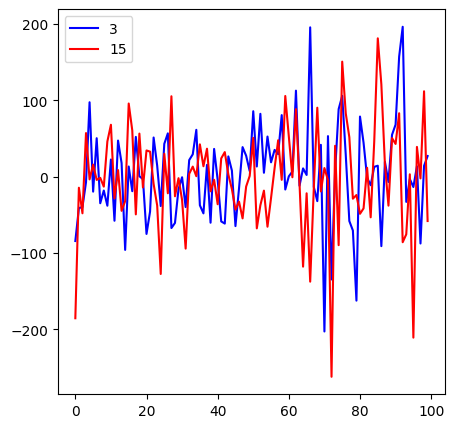

relation of 3 and 16


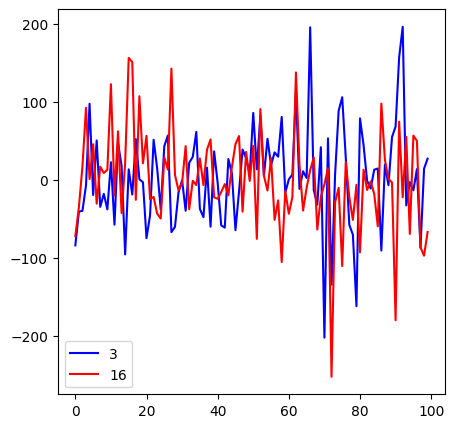

relation of 3 and 19


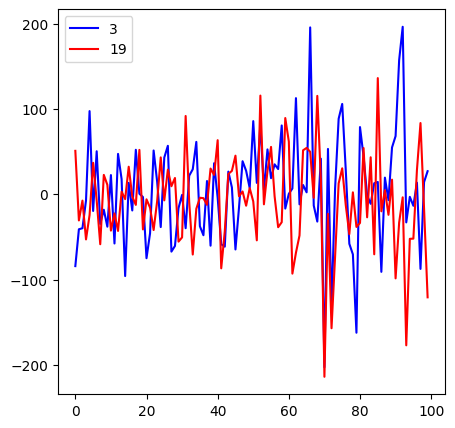

relation of 3 and 29


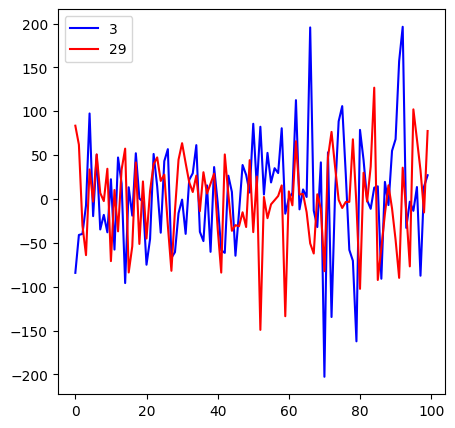

relation of 3 and 33


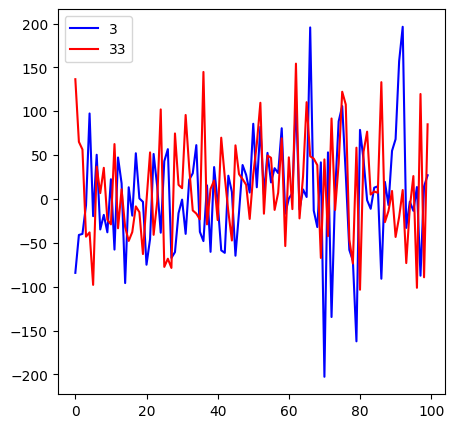

relation of 3 and 37


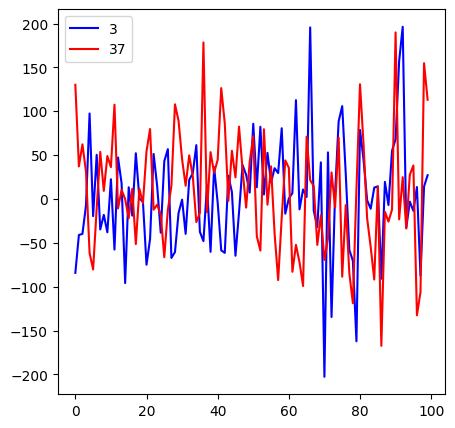

relation of 3 and 42


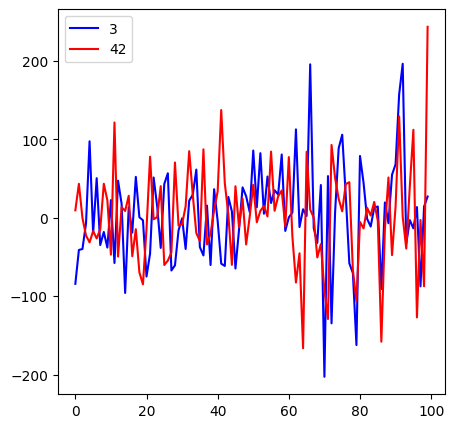

relation of 3 and 46


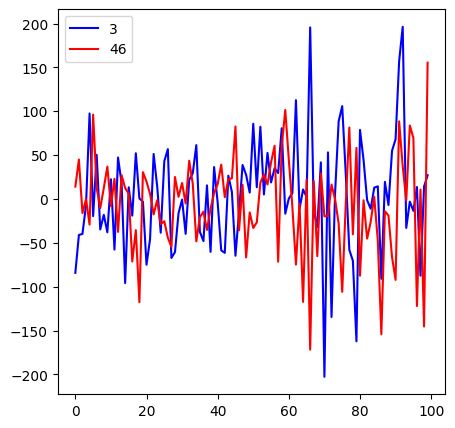

relation of 5 and 9


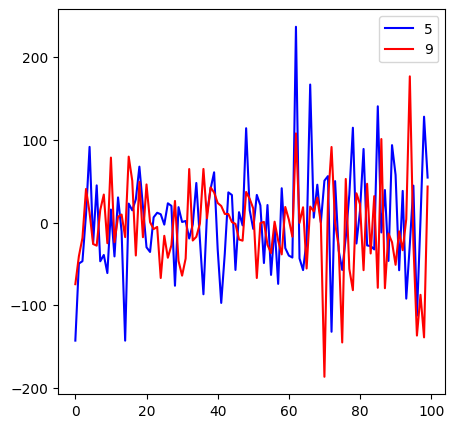

relation of 6 and 23


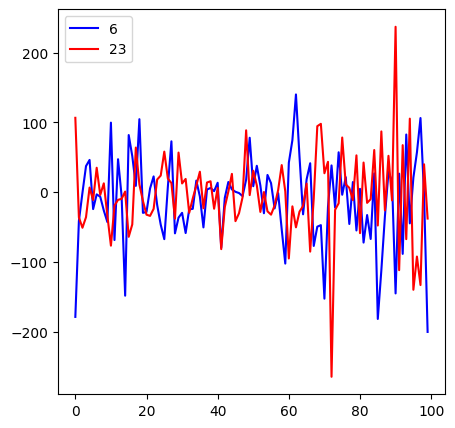

relation of 7 and 10


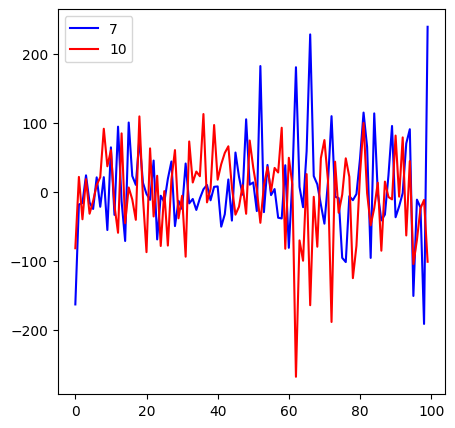

relation of 7 and 12


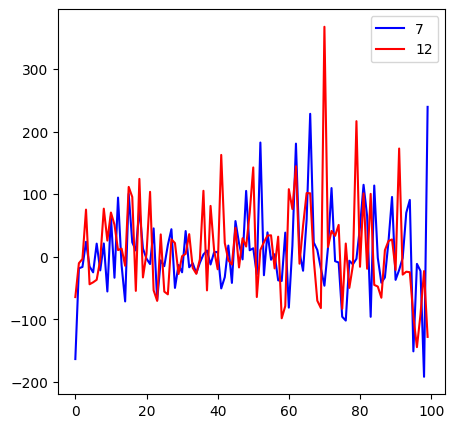

relation of 7 and 19


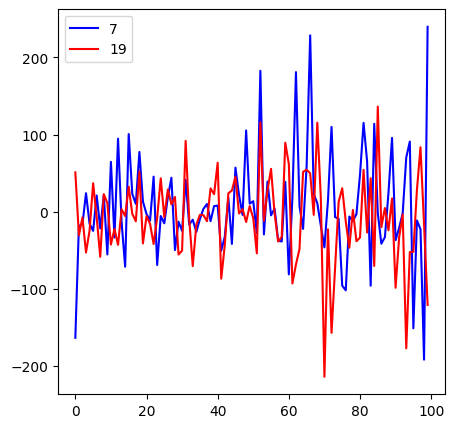

relation of 7 and 27


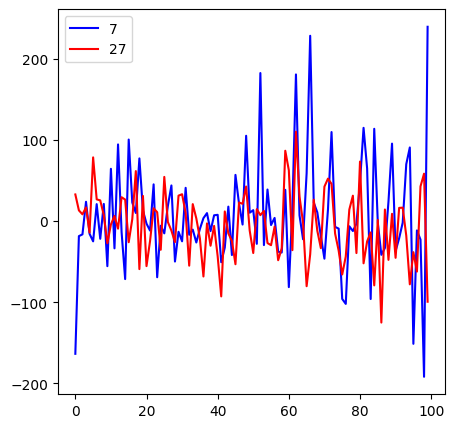

relation of 7 and 29


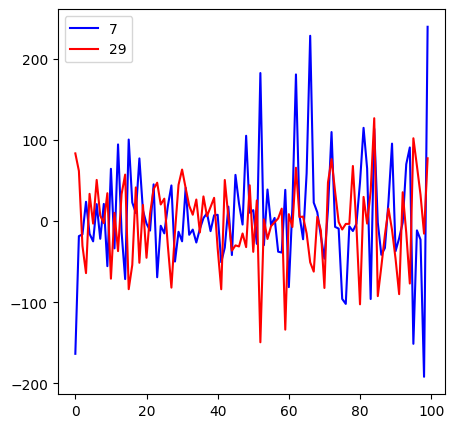

relation of 10 and 12


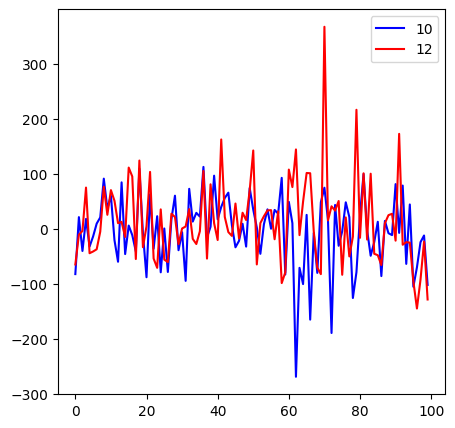

relation of 10 and 15


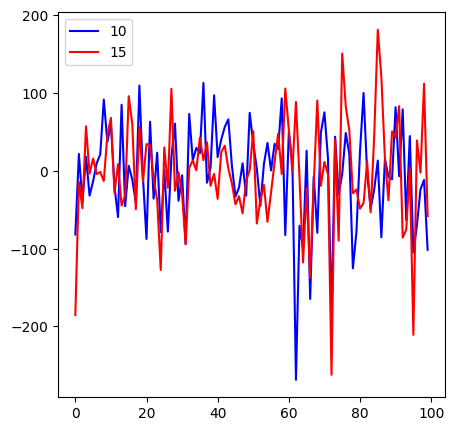

relation of 10 and 16


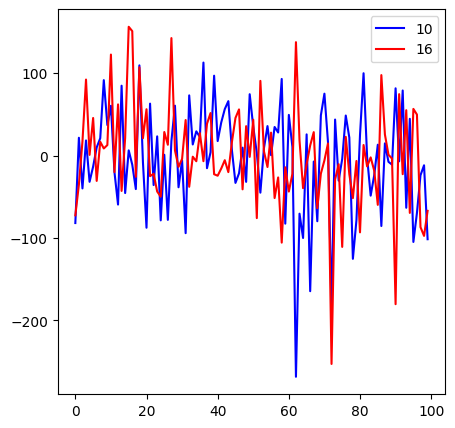

relation of 10 and 18


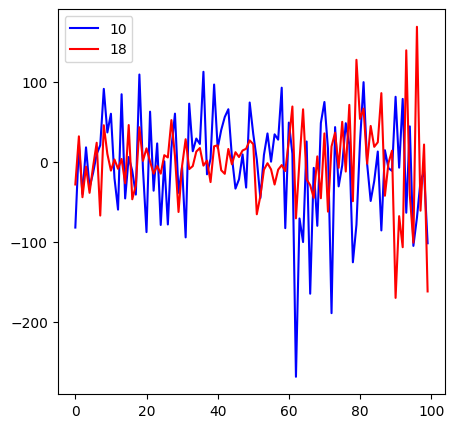

relation of 10 and 19


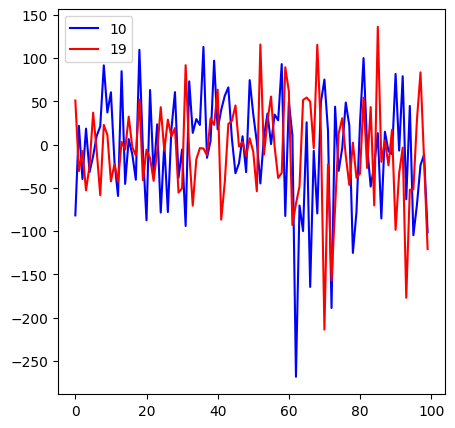

relation of 10 and 27


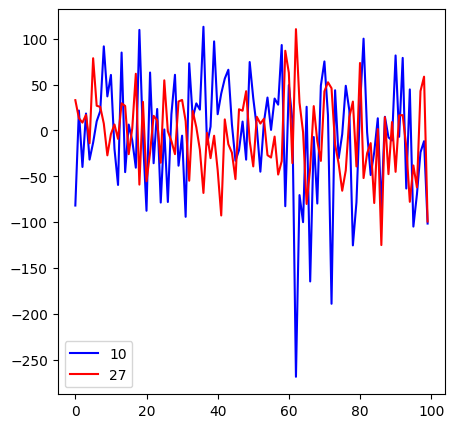

relation of 10 and 29


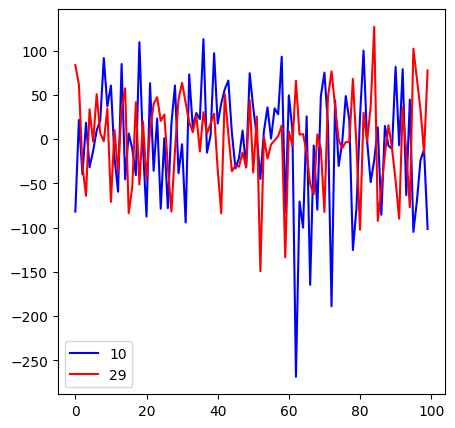

relation of 10 and 37


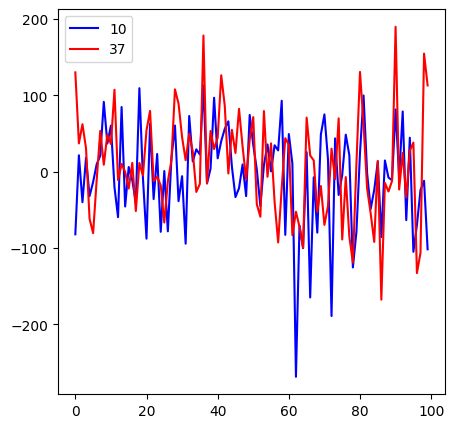

relation of 10 and 38


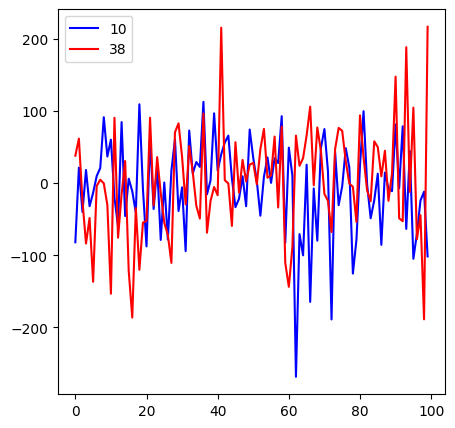

relation of 10 and 42


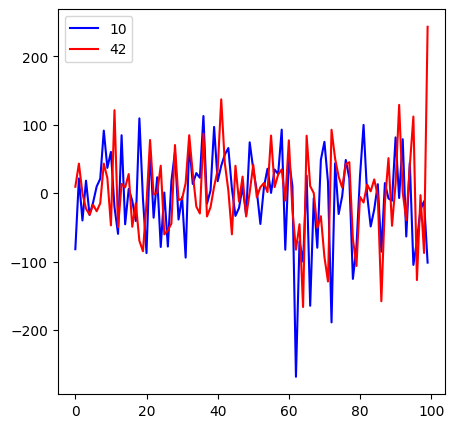

relation of 10 and 44


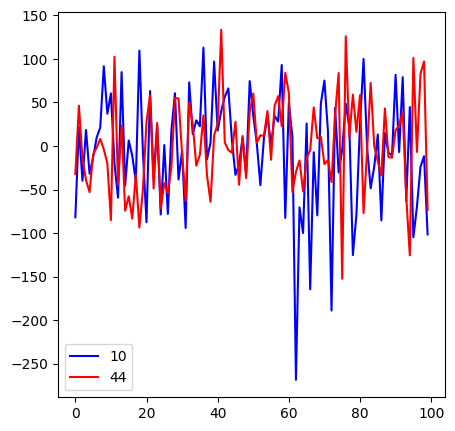

relation of 10 and 46


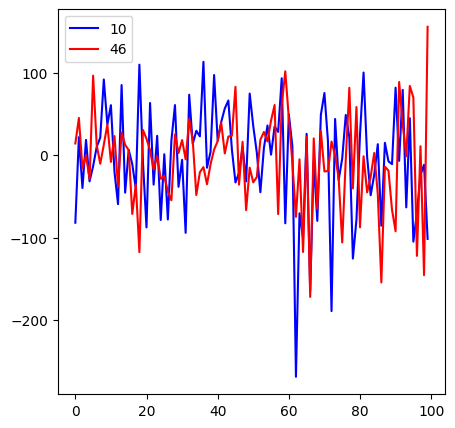

relation of 12 and 15


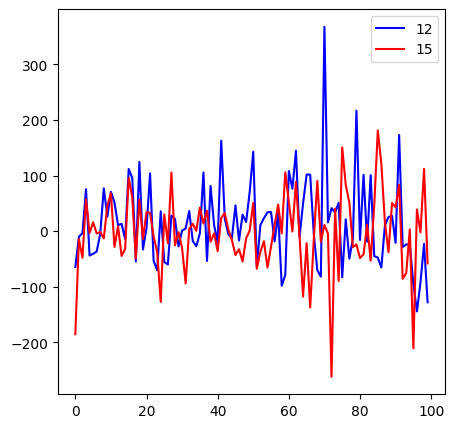

relation of 12 and 16


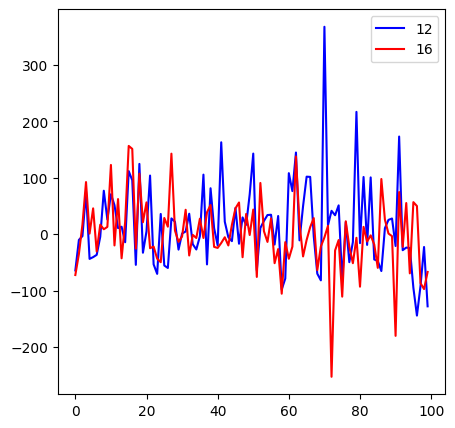

relation of 12 and 27


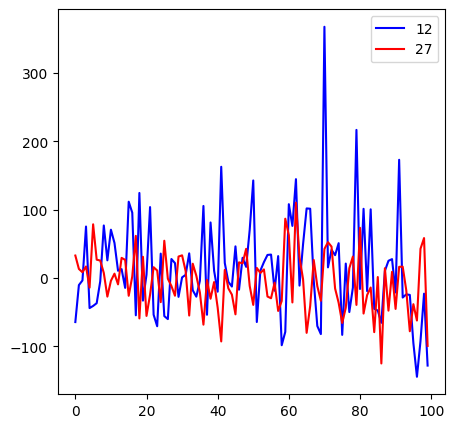

relation of 12 and 29


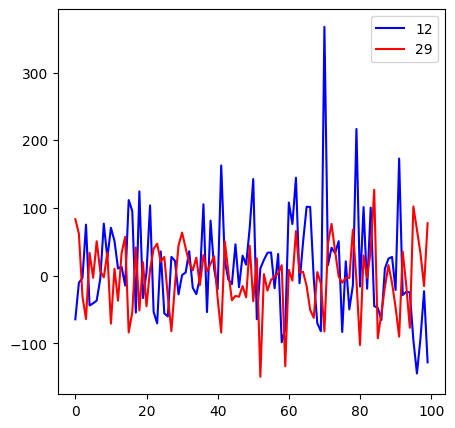

relation of 15 and 16


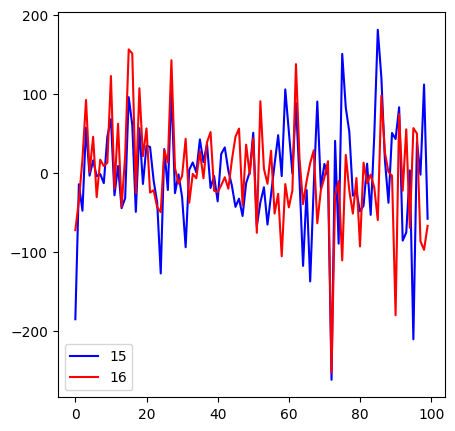

relation of 15 and 18


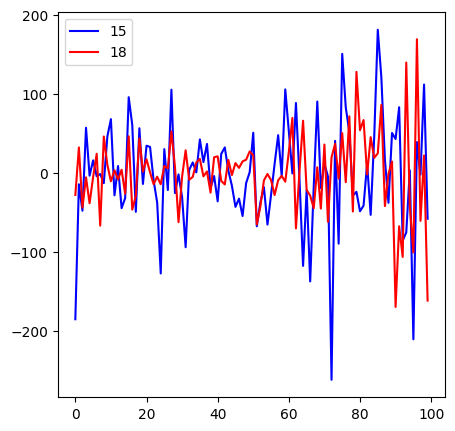

relation of 15 and 27


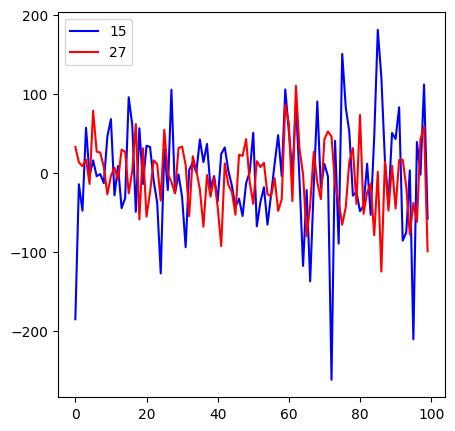

relation of 16 and 18


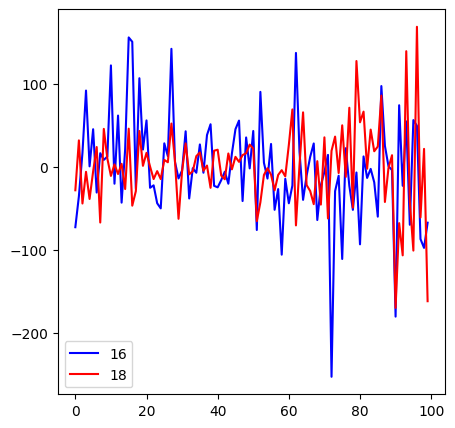

relation of 16 and 19


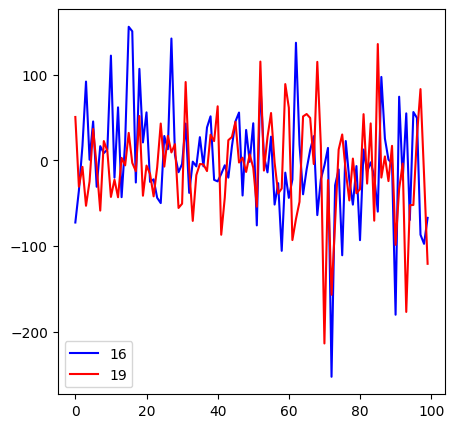

relation of 16 and 20


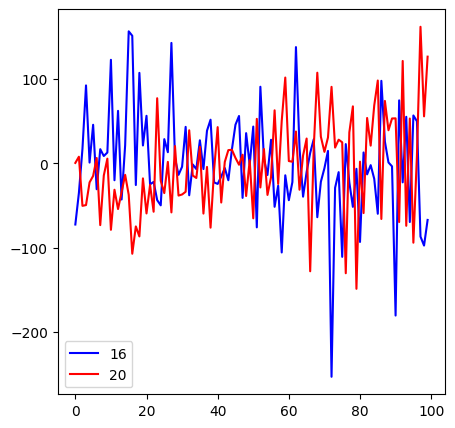

relation of 16 and 26


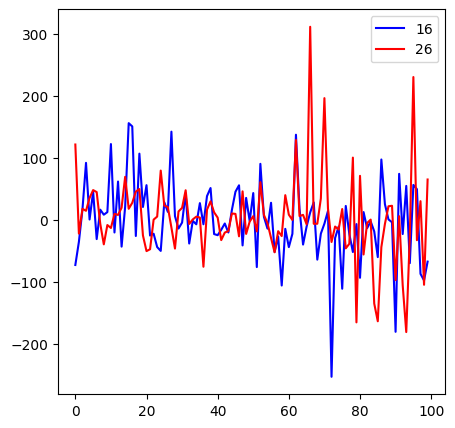

relation of 16 and 27


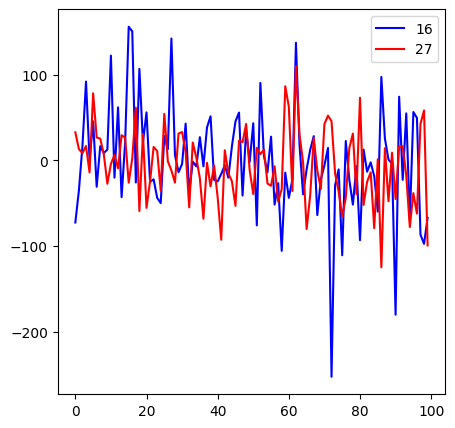

relation of 16 and 37


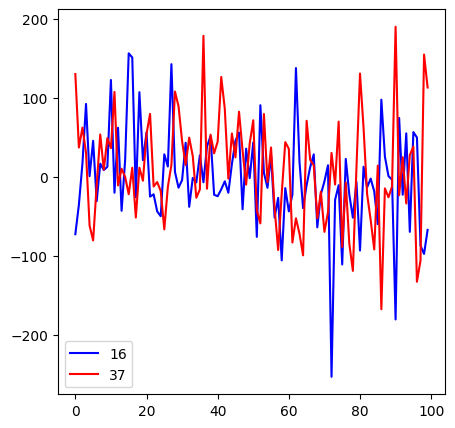

relation of 16 and 38


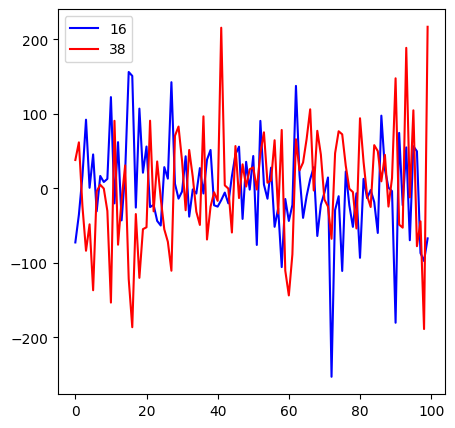

relation of 16 and 44


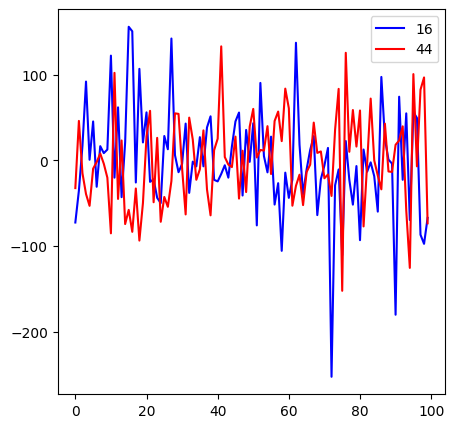

relation of 16 and 46


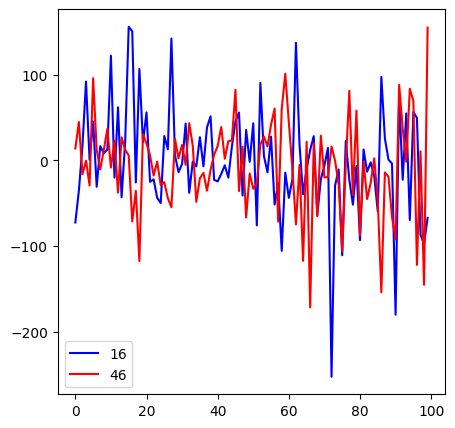

relation of 18 and 27


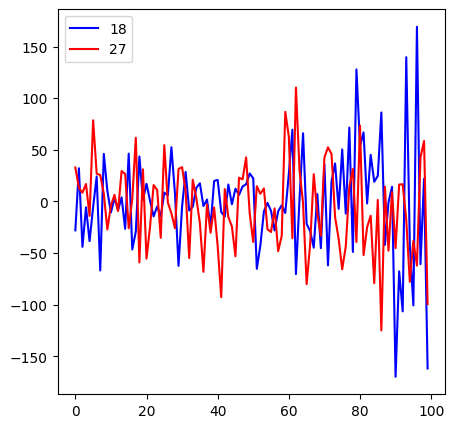

relation of 18 and 38


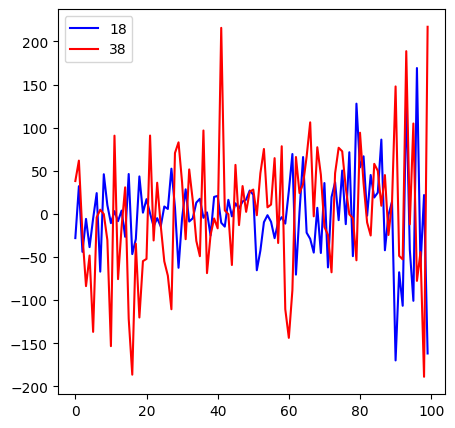

relation of 18 and 44


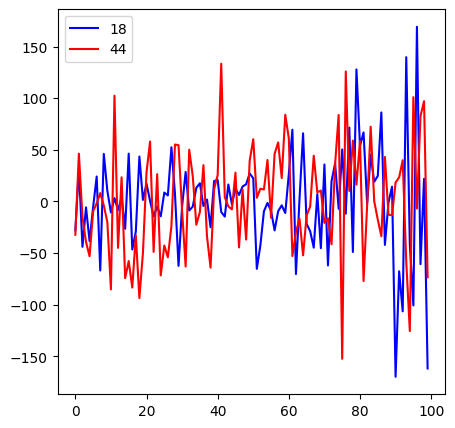

relation of 19 and 22


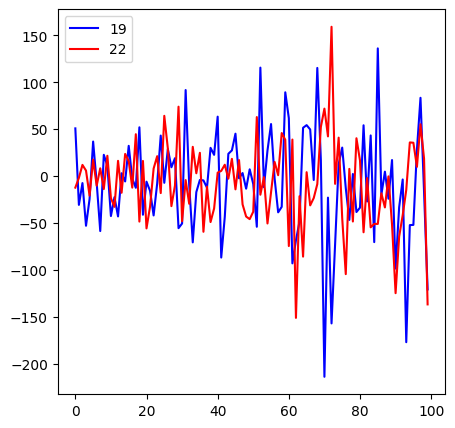

relation of 19 and 27


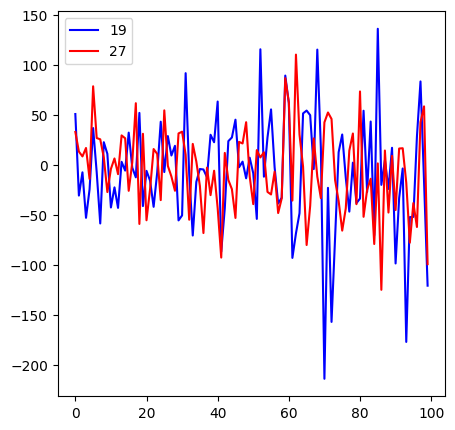

relation of 19 and 29


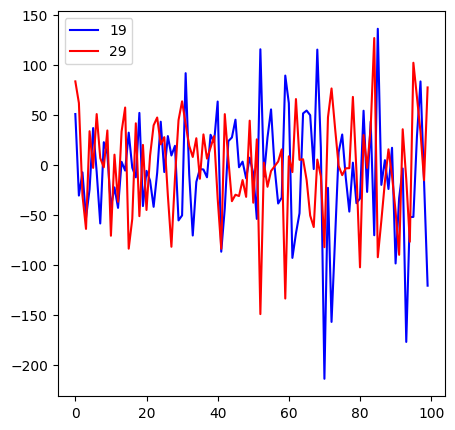

relation of 19 and 33


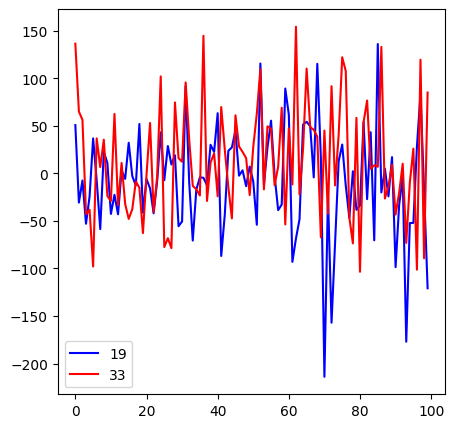

relation of 19 and 37


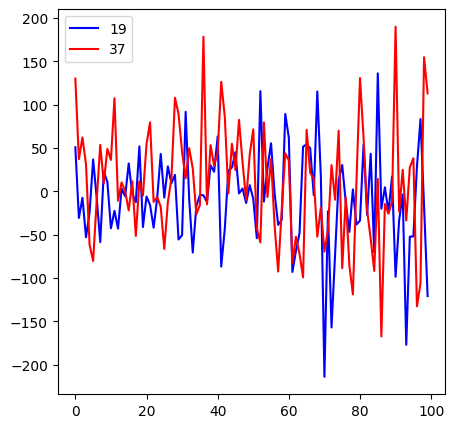

relation of 20 and 37


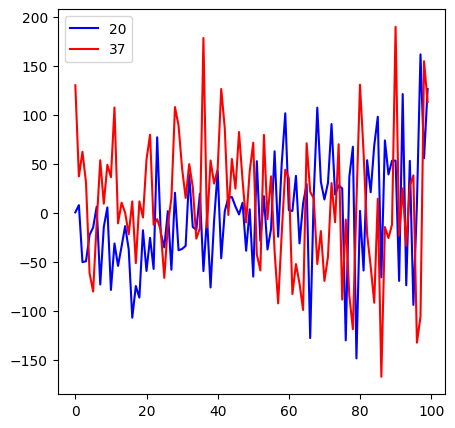

relation of 20 and 40


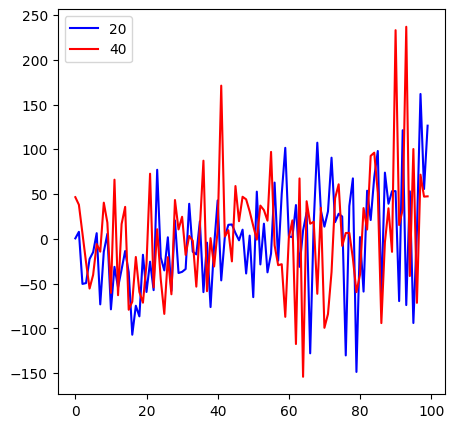

relation of 20 and 42


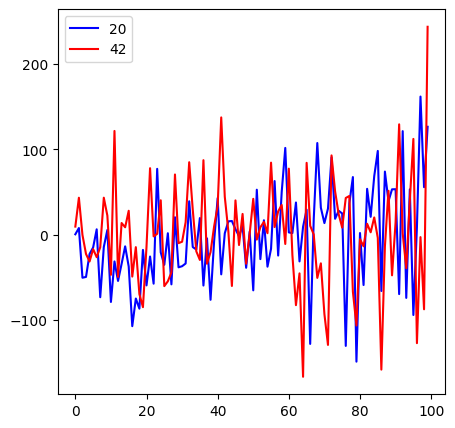

relation of 20 and 44


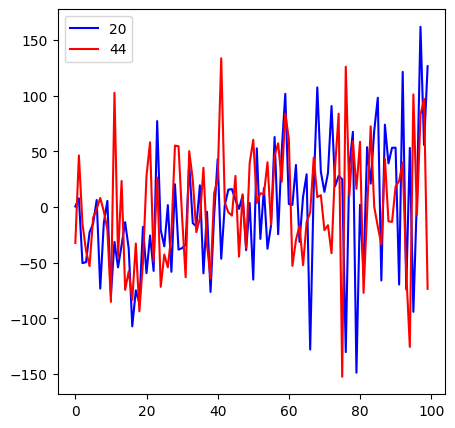

relation of 20 and 46


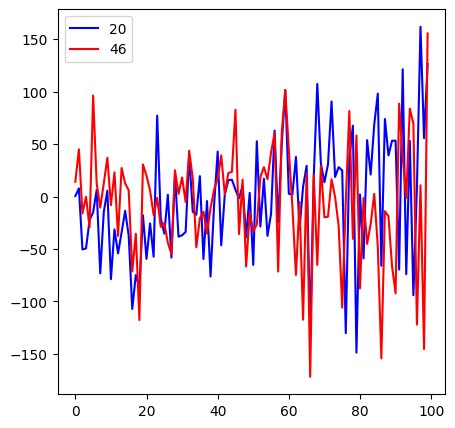

relation of 21 and 28


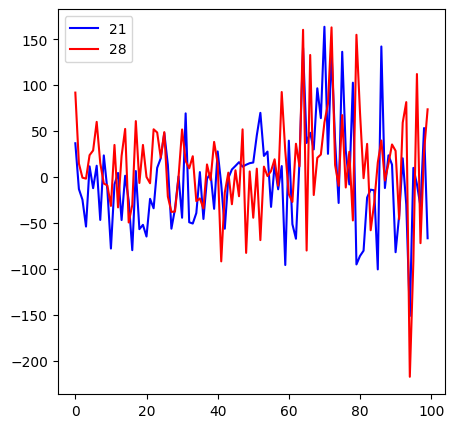

relation of 22 and 33


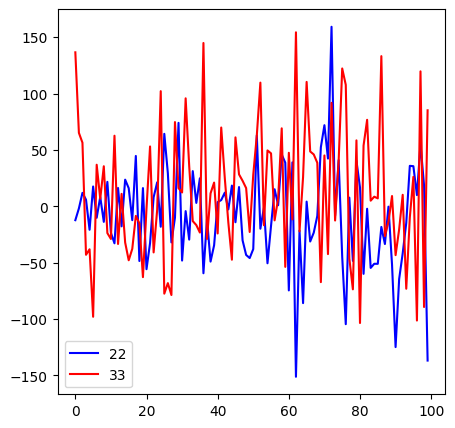

relation of 22 and 34


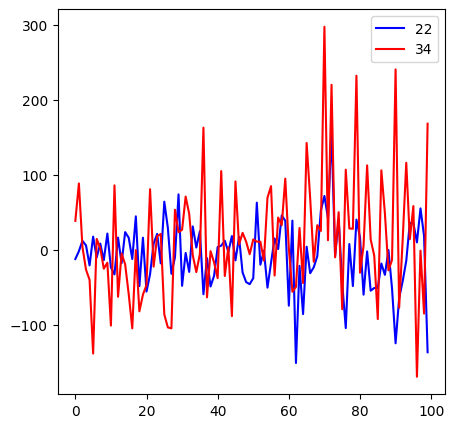

relation of 24 and 31


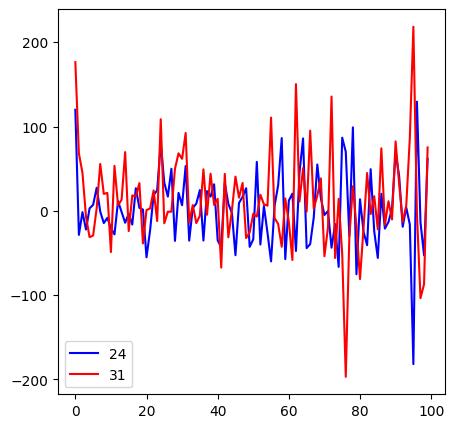

relation of 24 and 38


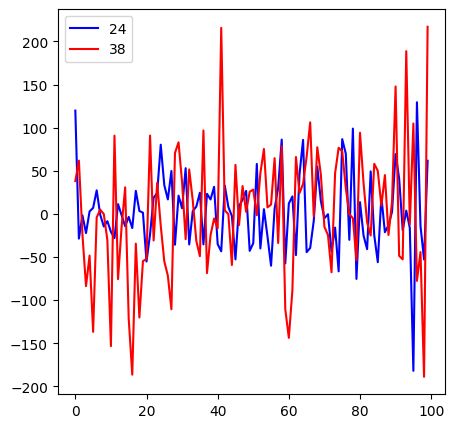

relation of 26 and 27


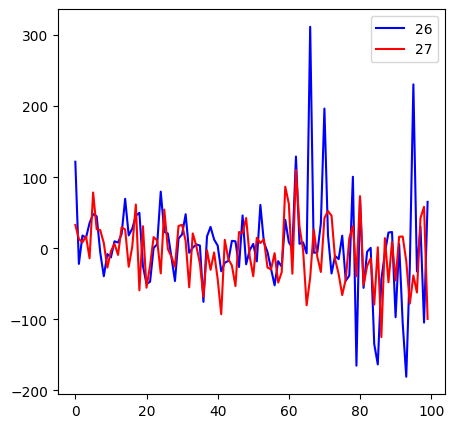

relation of 26 and 37


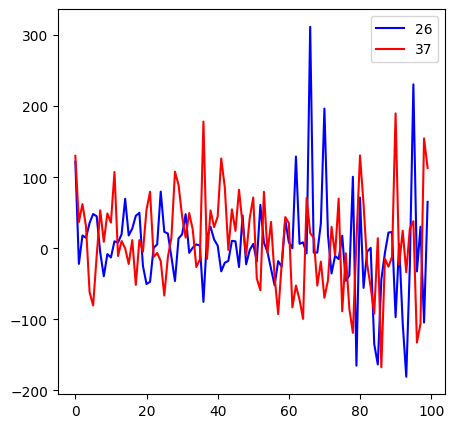

relation of 26 and 44


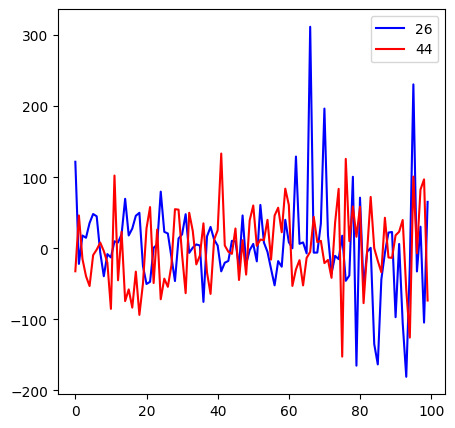

relation of 26 and 46


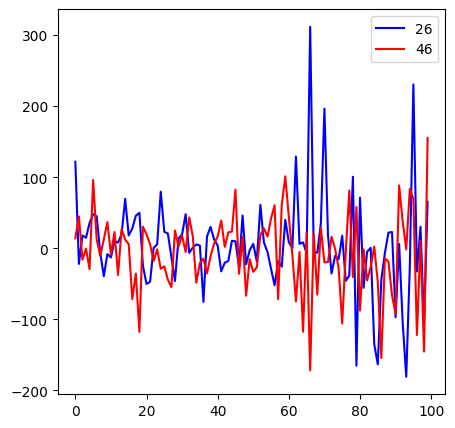

relation of 27 and 29


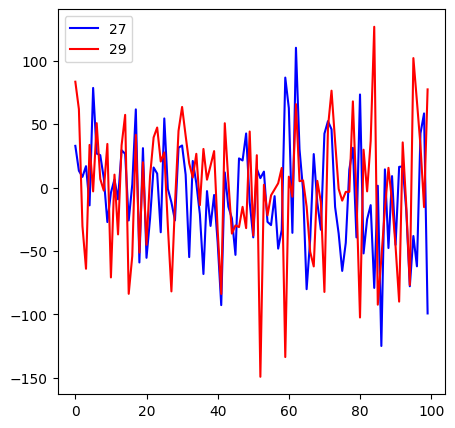

relation of 27 and 38


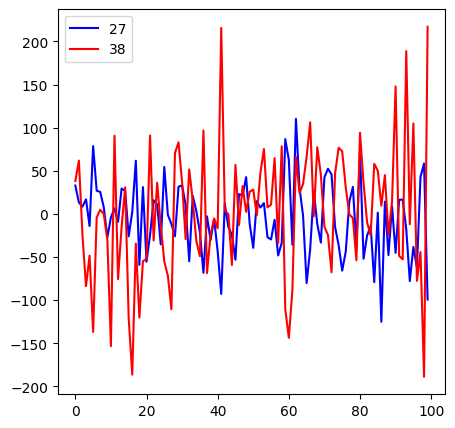

relation of 27 and 44


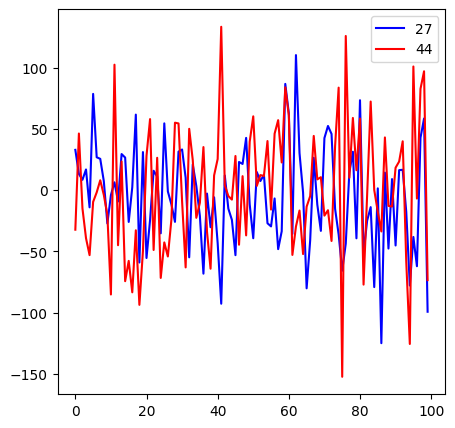

relation of 27 and 46


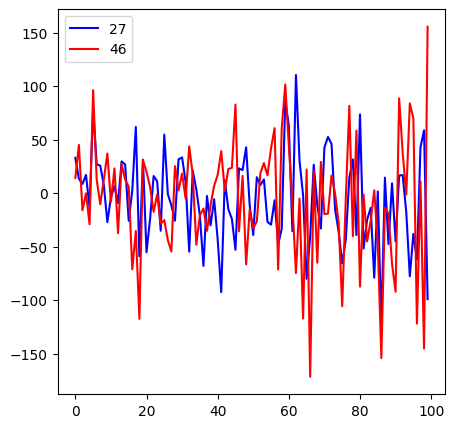

relation of 28 and 36


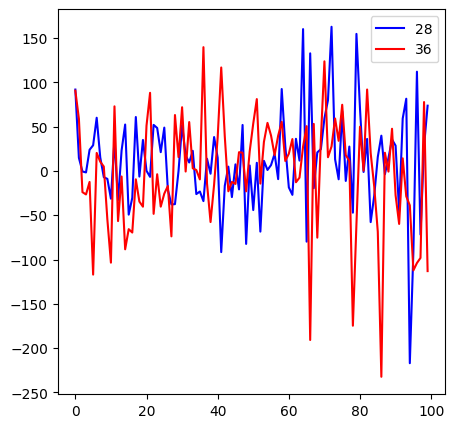

relation of 29 and 33


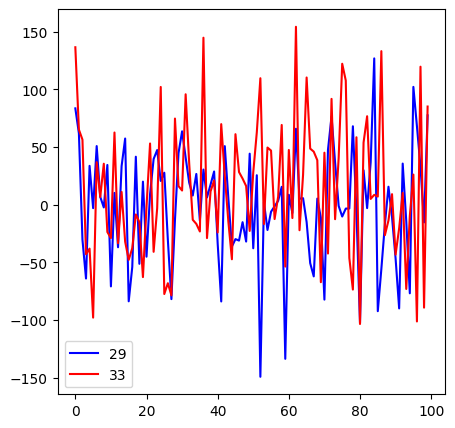

relation of 29 and 37


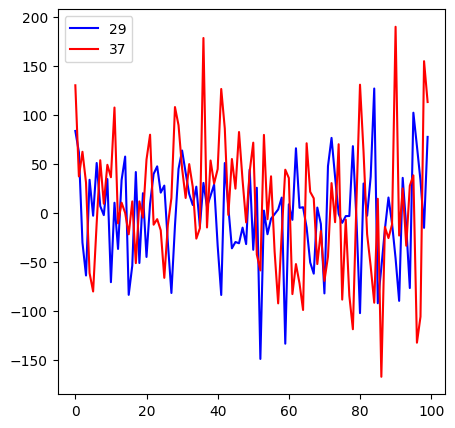

relation of 29 and 42


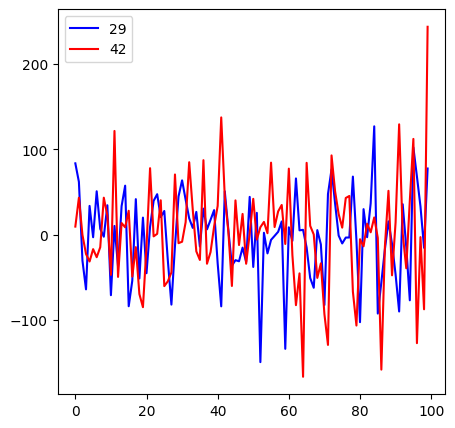

relation of 29 and 46


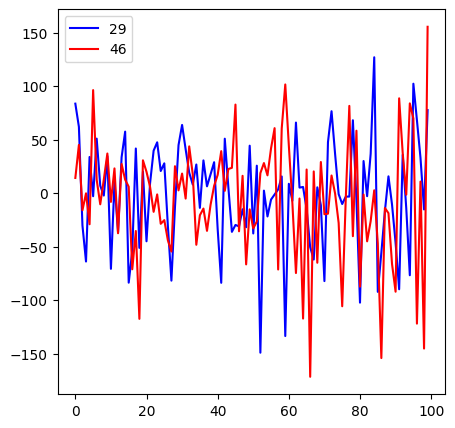

relation of 31 and 38


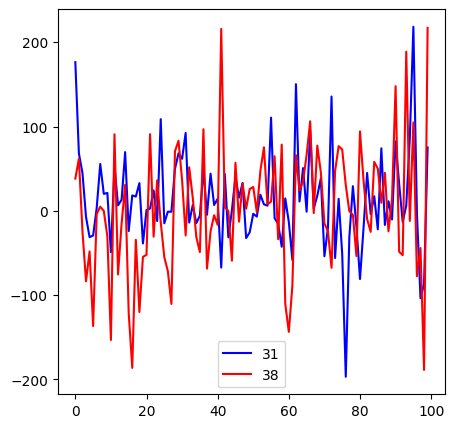

relation of 33 and 34


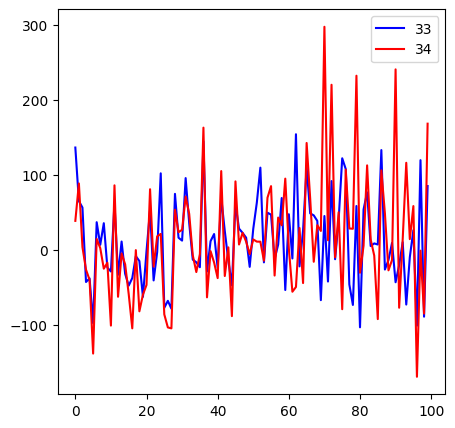

relation of 33 and 37


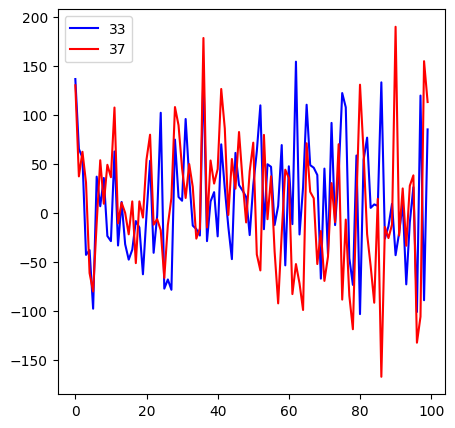

relation of 33 and 42


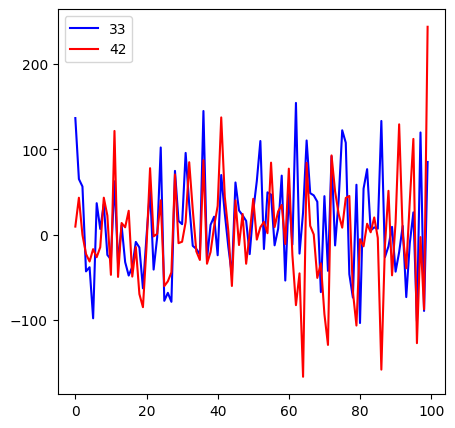

relation of 34 and 37


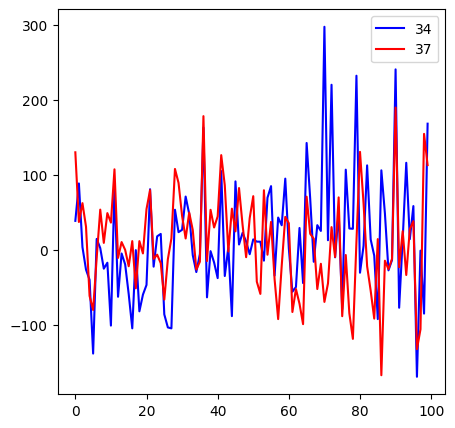

relation of 34 and 42


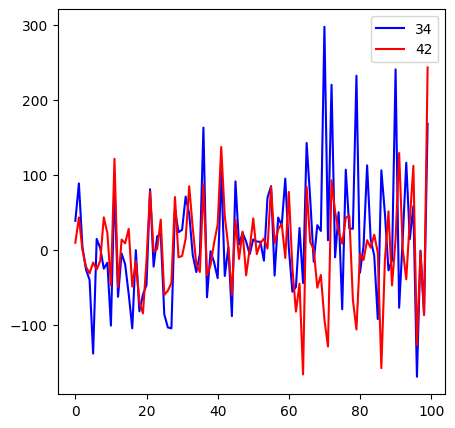

relation of 37 and 40


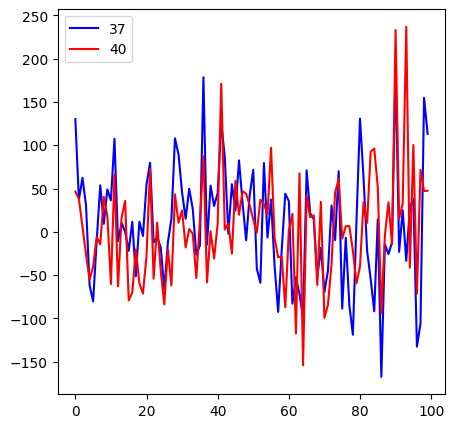

relation of 37 and 42


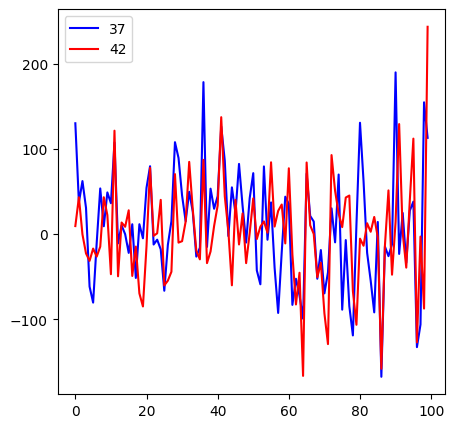

relation of 37 and 44


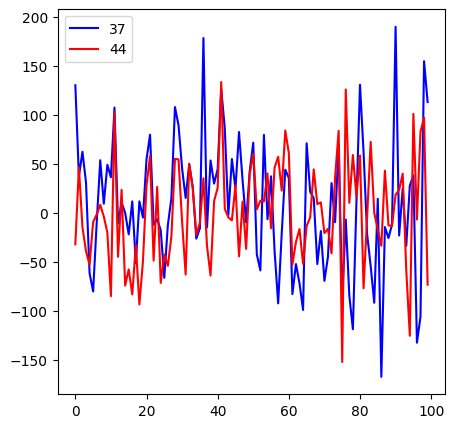

relation of 37 and 46


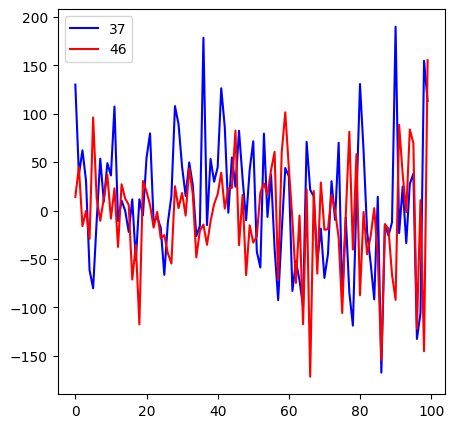

relation of 40 and 42


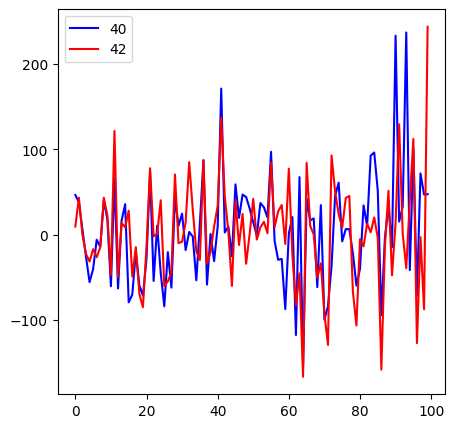

relation of 40 and 46


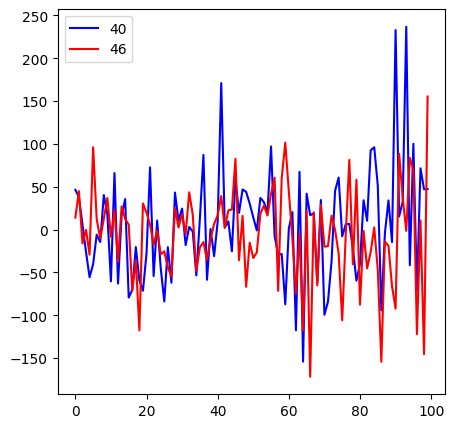

relation of 42 and 46


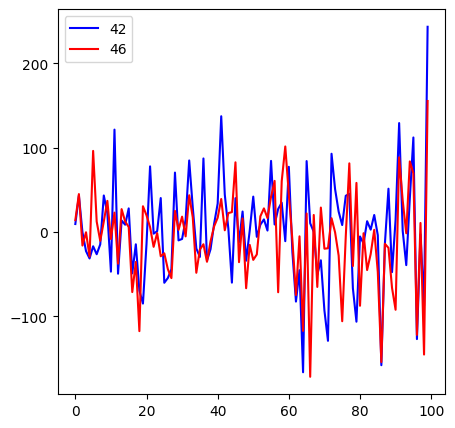

relation of 44 and 46


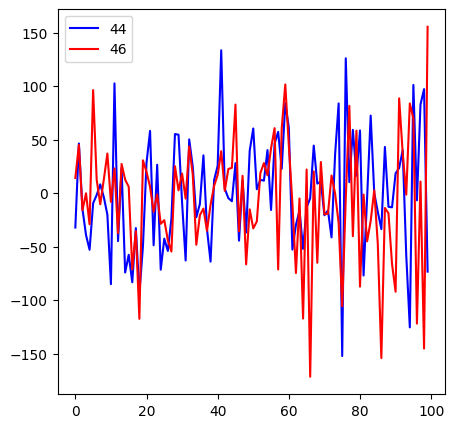

relation of 45 and 50


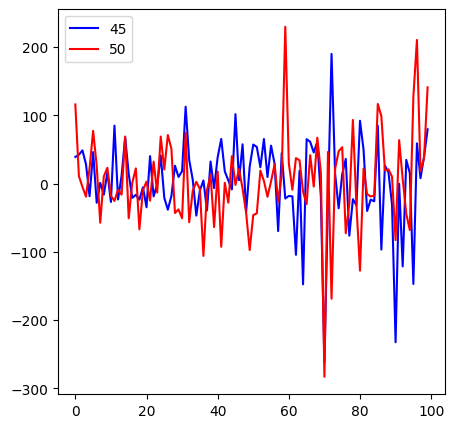

relation of 45 and 55


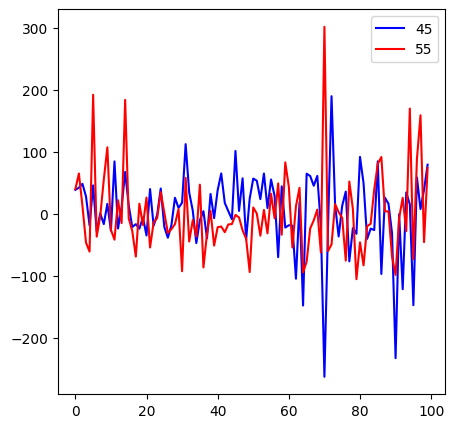

relation of 45 and 65


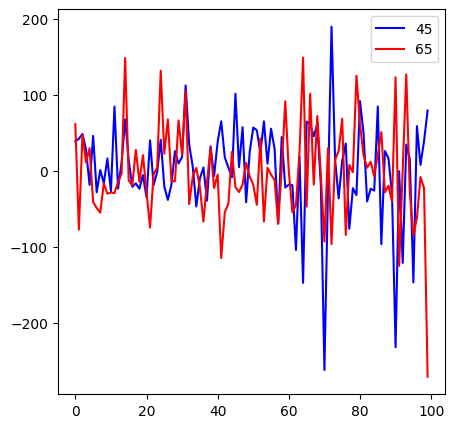

relation of 47 and 56


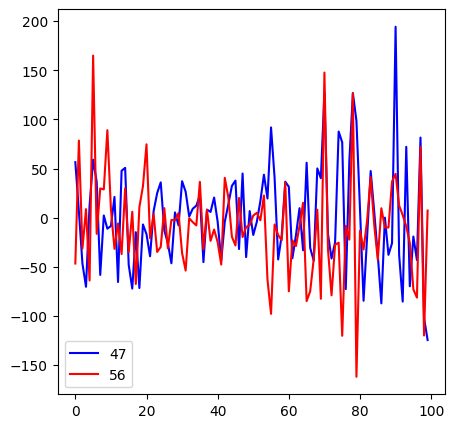

relation of 48 and 56


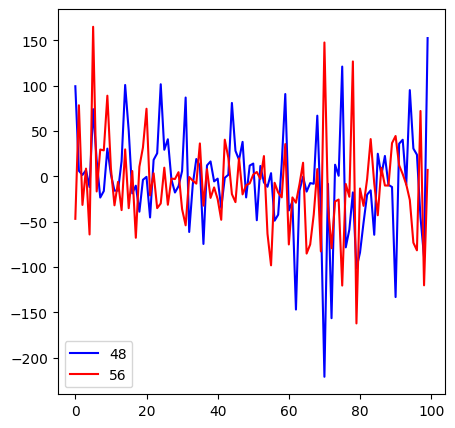

relation of 48 and 63


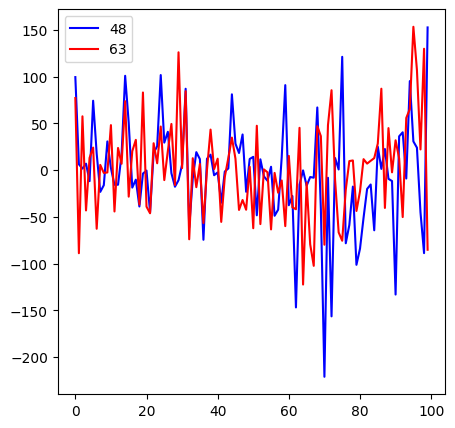

relation of 49 and 56


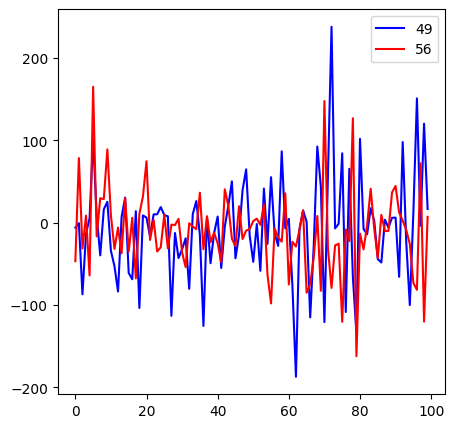

relation of 50 and 55


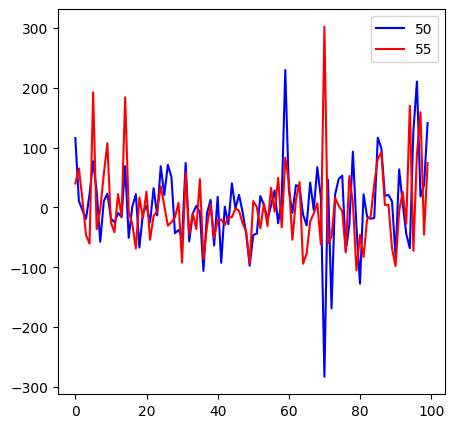

relation of 50 and 56


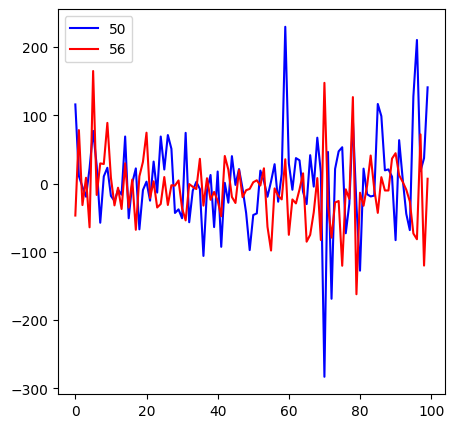

relation of 51 and 56


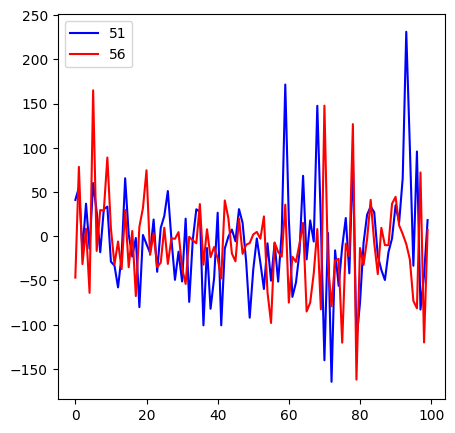

relation of 51 and 58


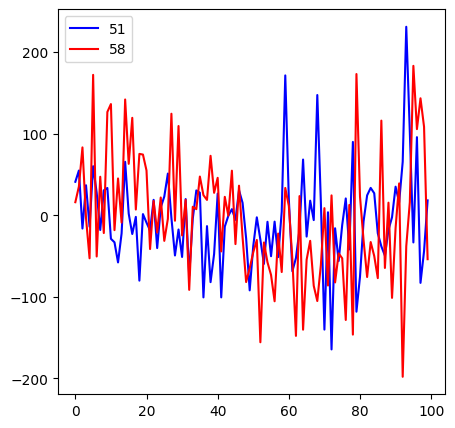

relation of 51 and 73


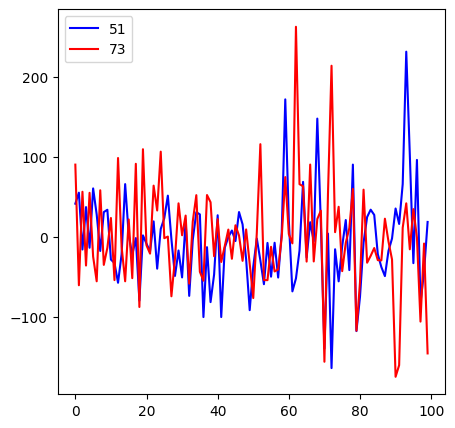

relation of 55 and 65


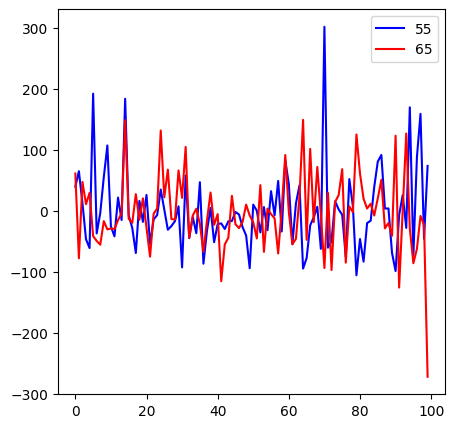

relation of 56 and 58


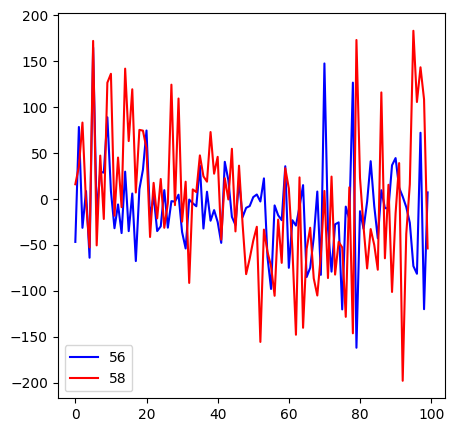

relation of 56 and 63


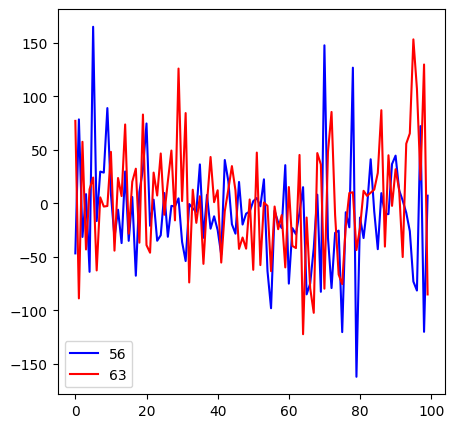

relation of 56 and 73


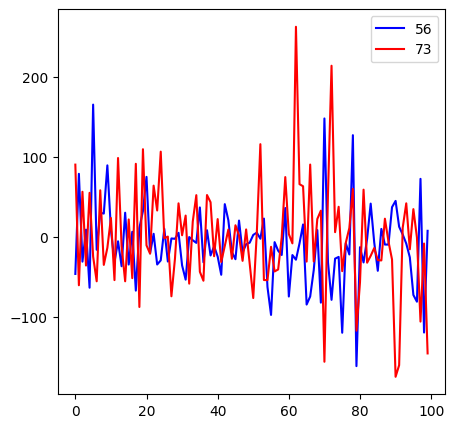

relation of 58 and 69


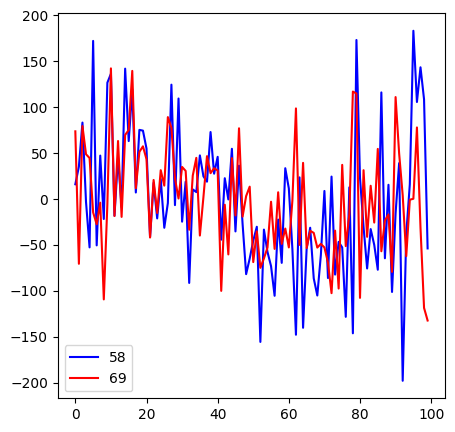

relation of 58 and 73


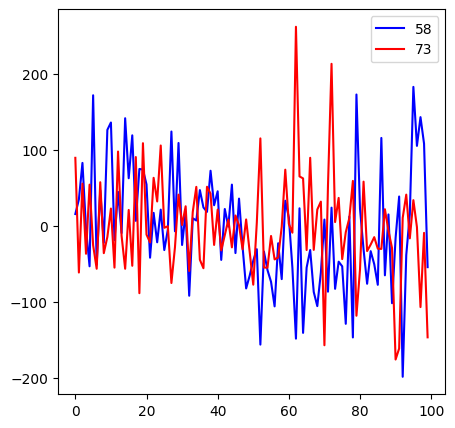

relation of 58 and 89


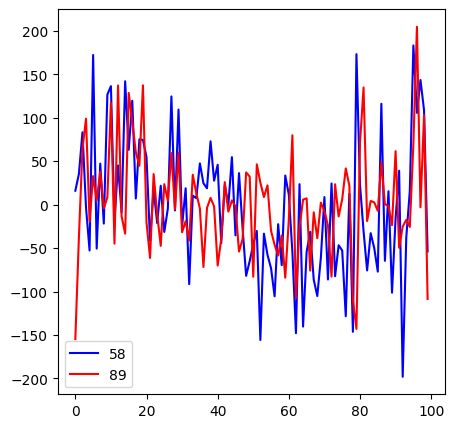

relation of 73 and 89


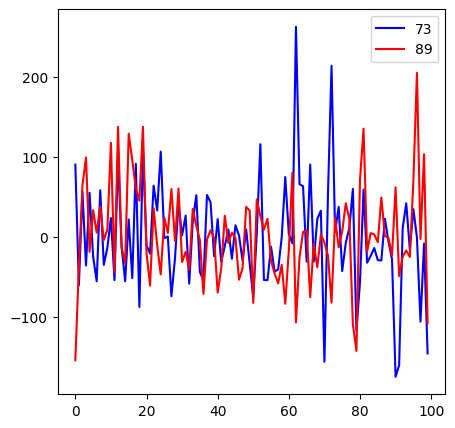

In [11]:
for i in filtered_indices:
    x_1, x_2 = i
    print(f"relation of {x_1} and {x_2}")
    data_1 = data[x_1]
    data_2 = data[x_2]
    plt.figure(figsize=(5, 5))
    plt.plot(data_1, color = "blue", label = x_1)
    plt.plot(data_2, color = "red", label = x_2)
    plt.legend()
    plt.show();

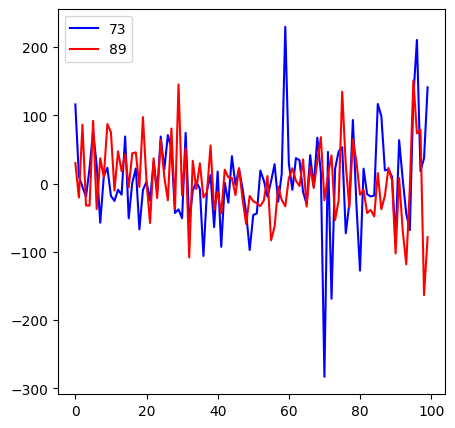

In [12]:
data_1 = data[50]
data_2 = data[60]
plt.figure(figsize=(5, 5))
plt.plot(data_1, color = "blue", label = x_1)
plt.plot(data_2, color = "red", label = x_2)
plt.legend()
plt.show();